# Attempting Rep Code Logical Dual Rail Qubits

## IMPORTS

In [1]:
import sys
! {sys.executable} --version



Python 3.12.11


In [2]:
import stim
import numpy as np
import pymatching

import networkx as nx
import matplotlib.pyplot as plt
from itertools import chain

import sinter
from typing import List


import pandas as pd
from scipy.optimize import fsolve

from decimal import Decimal

import mwpf


from decimal import Decimal

import random

import sys

from scipy.optimize import fsolve


In [3]:
import mwpf
from mwpf.sinter_decoders import SinterMWPFDecoder

from mwpf.ref_circuit import *
from mwpf.heralded_dem import *


In [4]:
print(np.__version__)

2.2.6


In [5]:
mwpf.heralded_dem


<module 'mwpf.heralded_dem' from 'c:\\Users\\diyan\\anaconda3\\envs\\simulation\\Lib\\site-packages\\mwpf\\heralded_dem.py'>

In [6]:
cmap = { 0:'orange',
            1:'green',
            2:'crimson',
            3:'deepskyblue', 
            4: "purple", 
            5: "coral", 
            6: "forestgreen",
            7: "firebrick",
            8: "navy",
            9: "blueviolet"}

# Playing with Stim, Sinter, and pymatching (Ignore if you are interested in actual results)

## proto_get_circuit_and_dem 

This function takes in the
* rounds: number of rounds of error correction
* distance: distance of the code
* shots: number of shots of EC
* bit_flip_rate_per_round: bitflip error rate
* heralded_erasure_err: erasure error rate
* misassign_err: measurement error rate

In order to create the stim.Circuit and stim.Circuit.detector_error_model that we can use to run shots of error correction on. 


In [7]:
def proto_get_circuit_and_dem(rounds, distance, shots, bit_flip_rate_per_round, heralded_erasure_err, misassign_err):

    qubits = range(((2 * distance) - 1))

    meas_qubits = qubits [1::2]
 
    data_qubits = qubits[0::2]

    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("CNOT", cnot1)
    c_i. append_operation ("CNOT", cnot2)
    c_i. append_operation ("MR", meas_qubits, misassign_err)
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c_i. append_operation ("MR", meas_qubits, misassign_err)
    #c_i. append("DETECTOR", [stim.target_rec(det_i_1)], (det_i_0, 0) )
    det_i_1 = -(distance - 1)


    for d in range(distance - 1):
        det_i_0 = (2*d) + 1
        c_i. append("DETECTOR", [stim.target_rec(det_i_1)], (det_i_0, 0) )
        det_i_1 += 1


    c = stim.Circuit ()
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("CNOT", cnot1)
    c. append_operation ("CNOT", cnot2)
    c. append_operation ("MR", meas_qubits, misassign_err)
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    c. append_operation ("MR", meas_qubits, misassign_err)
    det_i_1 = -(distance - 1)
    det_i_2 = -2*(distance - 1)

    c. append_operation ("SHIFT_COORDS", [], (0,1))

    for d in range(distance - 1):
        det_i_0 = (2*d) +1
        c. append("DETECTOR", [stim.target_rec(det_i_1), stim.target_rec(det_i_2)], (det_i_0, 0) )
        det_i_1 += 1
        det_i_2 += 1
    c *= rounds

    c. append_operation ("MR", meas_qubits, misassign_err)
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("MR", data_qubits, misassign_err)
    det_i_1 = -(distance - 1)
    det_i_3 = -(distance)
    det_i_4 = -(2*distance - 1)
    for d in range(distance - 1):
        det_i_0 = (2*d) +1
        c. append("DETECTOR", [stim.target_rec(det_i_1), stim.target_rec(det_i_3), stim.target_rec(det_i_4)], (det_i_0, 1) )
        det_i_1 += 1
        det_i_3 += 1
        det_i_4 += 1
    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c

    print(c)

    detector_error_model = c.detector_error_model(decompose_errors=False, approximate_disjoint_errors=True)



    return {'circuit': c, 'dem': detector_error_model}

## Testing Decoding of bitflip and erasure error with only pymatching (spoiler unsucessful)

In [8]:
distance = 3
rounds = 20
shots = 10**(5)
err = 0.01
bit_flip_rate_per_round = 10**(-2)
heralded_erasure_err = 0.01
misassign_err = 10**(-3)



c = proto_get_circuit_and_dem(rounds, distance, shots, bit_flip_rate_per_round, heralded_erasure_err, misassign_err)['circuit']

sampler = c .compile_detector_sampler()
detection_events, observable_flips = sampler.sample(shots, separate_observables=True)
# print("observable_flips", observable_flips)

# Configure a decoder using the circuit.

print(detection_events)
print("observable_flips", observable_flips)

detector_error_model_F = proto_get_circuit_and_dem(rounds, distance, shots, bit_flip_rate_per_round, heralded_erasure_err, misassign_err)['dem']
matcher_F = pymatching.Matching.from_detector_error_model(detector_error_model_F)

predictions_F = matcher_F.decode_batch(detection_events)


num_errors_F = 0
for shot in range(shots):
    actual_for_shot = observable_flips[shot].astype(int)
    predicted_for_shot_F = predictions_F[shot]
    print("\n",(actual_for_shot))
    print(predicted_for_shot_F)
    if np.array_equal(actual_for_shot, predicted_for_shot_F) == False:
        # print("\n",(actual_for_shot))
        # print(predicted_for_shot_F)
        num_errors_F += 1



# print((actual_for_shot, predicted_for_shot_F))

percentage_error = num_errors_F/ shots

print(percentage_error)

R 0 1 2 3 4
X_ERROR(0.01) 0 1 2 3 4
CX 0 1 2 3 4 3 2 1
MR(0.001) 1 3
HERALDED_ERASE(0.01) 0 1 2 3 4
MR(0.001) 1 3
DETECTOR(1, 0) rec[-2]
DETECTOR(3, 0) rec[-1]
REPEAT 20 {
    X_ERROR(0.01) 0 1 2 3 4
    CX 0 1 2 3 4 3 2 1
    MR(0.001) 1 3
    HERALDED_ERASE(0.01) 0 1 2 3 4
    MR(0.001) 1 3
    SHIFT_COORDS(0, 1)
    DETECTOR(1, 0) rec[-2] rec[-4]
    DETECTOR(3, 0) rec[-1] rec[-3]
}
MR(0.001) 1 3
HERALDED_ERASE(0.01) 0 1 2 3 4
MR(0.001) 0 2 4
DETECTOR(1, 1) rec[-2] rec[-3] rec[-5]
DETECTOR(3, 1) rec[-1] rec[-2] rec[-4]
OBSERVABLE_INCLUDE(0) rec[-1]
[[False False False ... False False False]
 [False False False ... False  True  True]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False  True]
 [False False False ... False False  True]]
observable_flips [[False]
 [False]
 [False]
 ...
 [False]
 [False]
 [ True]]
R 0 1 2 3 4
X_ERROR(0.01) 0 1 2 3 4
CX 0 1 2 3 4 3 2 1
MR(0.001) 1 3
HERALDED_ERASE(0.01) 0 1 2 3 4
M

## heralded erasure with pymatching only

In [9]:
heralded_erasure_err_list = np.logspace(-2,-1,10)

In [10]:
tasks = [
            sinter.Task(
                circuit=proto_get_circuit_and_dem(d*3, d, shots, 
                                            bit_flip_rate_per_round, 
                                            hee, 
                                            misassign_err)['circuit'],
                json_metadata={'p': hee, 'd':d},
                detector_error_model=proto_get_circuit_and_dem(d*3, d, shots, 
                                                         bit_flip_rate_per_round, 
                                                         hee, 
                                                         misassign_err)['dem'],
                decoder='pymatching'
            )
            for d in [3,5,9,11,15]
            for hee in heralded_erasure_err_list
        ]

collected_stats: List[sinter.TaskStats] = sinter.collect(
    num_workers=1,
    tasks=tasks,
    decoders=['pymatching'],
    max_shots=10**(5),
    # max_errors=1000,
    count_detection_events=True
)

R 0 1 2 3 4
X_ERROR(0.01) 0 1 2 3 4
CX 0 1 2 3 4 3 2 1
MR(0.001) 1 3
HERALDED_ERASE(0.01) 0 1 2 3 4
MR(0.001) 1 3
DETECTOR(1, 0) rec[-2]
DETECTOR(3, 0) rec[-1]
REPEAT 9 {
    X_ERROR(0.01) 0 1 2 3 4
    CX 0 1 2 3 4 3 2 1
    MR(0.001) 1 3
    HERALDED_ERASE(0.01) 0 1 2 3 4
    MR(0.001) 1 3
    SHIFT_COORDS(0, 1)
    DETECTOR(1, 0) rec[-2] rec[-4]
    DETECTOR(3, 0) rec[-1] rec[-3]
}
MR(0.001) 1 3
HERALDED_ERASE(0.01) 0 1 2 3 4
MR(0.001) 0 2 4
DETECTOR(1, 1) rec[-2] rec[-3] rec[-5]
DETECTOR(3, 1) rec[-1] rec[-2] rec[-4]
OBSERVABLE_INCLUDE(0) rec[-1]
R 0 1 2 3 4
X_ERROR(0.01) 0 1 2 3 4
CX 0 1 2 3 4 3 2 1
MR(0.001) 1 3
HERALDED_ERASE(0.01) 0 1 2 3 4
MR(0.001) 1 3
DETECTOR(1, 0) rec[-2]
DETECTOR(3, 0) rec[-1]
REPEAT 9 {
    X_ERROR(0.01) 0 1 2 3 4
    CX 0 1 2 3 4 3 2 1
    MR(0.001) 1 3
    HERALDED_ERASE(0.01) 0 1 2 3 4
    MR(0.001) 1 3
    SHIFT_COORDS(0, 1)
    DETECTOR(1, 0) rec[-2] rec[-4]
    DETECTOR(3, 0) rec[-1] rec[-3]
}
MR(0.001) 1 3
HERALDED_ERASE(0.01) 0 1 2 3 4
MR(0.001) 

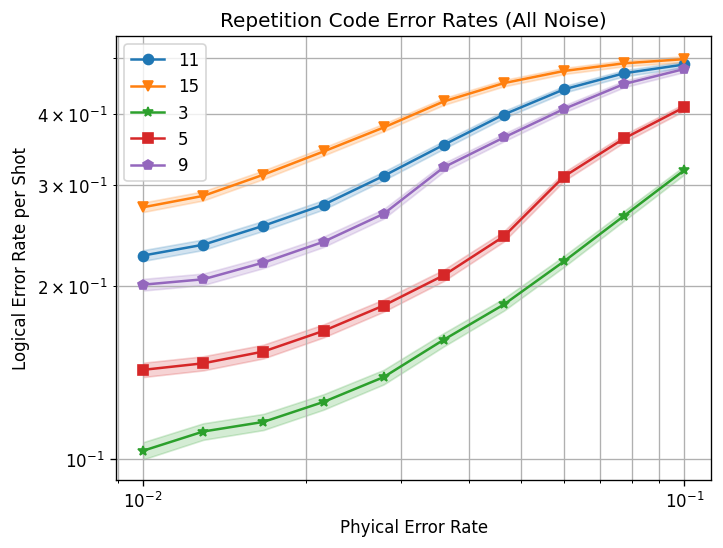

In [11]:
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (All Noise)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120)  # Show it bigger

In [12]:
tasks = [
            sinter.Task(
                circuit=proto_get_circuit_and_dem(d*3, d, shots, 
                                            0, 
                                            hee, 
                                            0)['circuit'],
                json_metadata={'p': hee, 'd':d},
                detector_error_model=proto_get_circuit_and_dem(d*3, d, shots, 
                                                         0, 
                                                         hee, 
                                                         0)['dem'],
                decoder='pymatching'
            )
            for d in [3,5,9,11,15]
            for hee in heralded_erasure_err_list
        ]

collected_stats: List[sinter.TaskStats] = sinter.collect(
    num_workers=4,
    tasks=tasks,
    decoders=['pymatching'],
    max_shots=10**(5),
    # max_errors=1000,
    count_detection_events=True
)

R 0 1 2 3 4
X_ERROR(0) 0 1 2 3 4
CX 0 1 2 3 4 3 2 1
MR(0) 1 3
HERALDED_ERASE(0.01) 0 1 2 3 4
MR(0) 1 3
DETECTOR(1, 0) rec[-2]
DETECTOR(3, 0) rec[-1]
REPEAT 9 {
    X_ERROR(0) 0 1 2 3 4
    CX 0 1 2 3 4 3 2 1
    MR(0) 1 3
    HERALDED_ERASE(0.01) 0 1 2 3 4
    MR(0) 1 3
    SHIFT_COORDS(0, 1)
    DETECTOR(1, 0) rec[-2] rec[-4]
    DETECTOR(3, 0) rec[-1] rec[-3]
}
MR(0) 1 3
HERALDED_ERASE(0.01) 0 1 2 3 4
MR(0) 0 2 4
DETECTOR(1, 1) rec[-2] rec[-3] rec[-5]
DETECTOR(3, 1) rec[-1] rec[-2] rec[-4]
OBSERVABLE_INCLUDE(0) rec[-1]
R 0 1 2 3 4
X_ERROR(0) 0 1 2 3 4
CX 0 1 2 3 4 3 2 1
MR(0) 1 3
HERALDED_ERASE(0.01) 0 1 2 3 4
MR(0) 1 3
DETECTOR(1, 0) rec[-2]
DETECTOR(3, 0) rec[-1]
REPEAT 9 {
    X_ERROR(0) 0 1 2 3 4
    CX 0 1 2 3 4 3 2 1
    MR(0) 1 3
    HERALDED_ERASE(0.01) 0 1 2 3 4
    MR(0) 1 3
    SHIFT_COORDS(0, 1)
    DETECTOR(1, 0) rec[-2] rec[-4]
    DETECTOR(3, 0) rec[-1] rec[-3]
}
MR(0) 1 3
HERALDED_ERASE(0.01) 0 1 2 3 4
MR(0) 0 2 4
DETECTOR(1, 1) rec[-2] rec[-3] rec[-5]
DETECTOR(3, 1) 

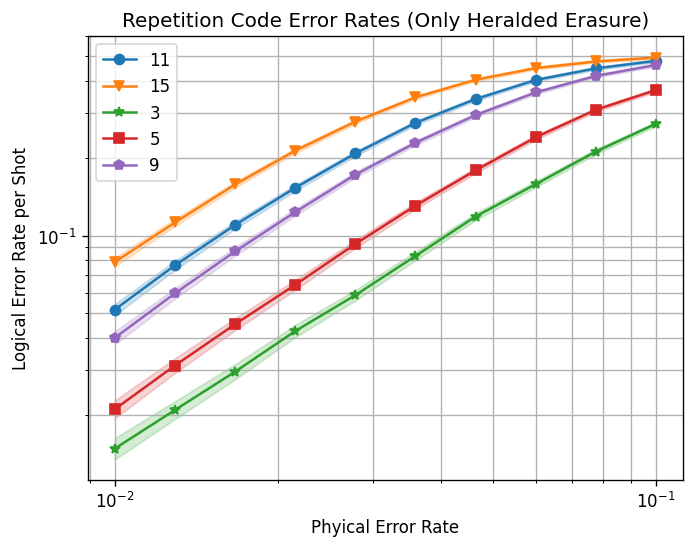

In [13]:
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Only Heralded Erasure)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120)  # Show it bigger

# mwpf

mwpf is a decoder that works on hypergraphs. The github repo for mwpf includes a heralded erasure decoder. It is designed for subthreshold circuit simulation, so it can be very time consuming to use to find thresholds and figure out the performance of error correcting codes.

In [ ]:
import mwpf
from mwpf.sinter_decoders import SinterMWPFDecoder

from mwpf.ref_circuit import *
from mwpf.heralded_dem import *


## get_circuit_and_dem 

This function takes in the
* rounds: number of rounds of error correction
* distance: distance of the code
* shots: number of shots of EC
* bit_flip_rate_per_round: bitflip error rate
* heralded_erasure_err: erasure error rate
* misassign_err: measurement error rate

In order to create the stim.Circuit and stim.Circuit.detector_error_model that we can use to run shots of error correction on. 


In [ ]:
def get_circuit_and_dem(rounds, distance, shots, bit_flip_rate_per_round, heralded_erasure_err, misassign_err):

    qubits = range(((2 * distance) - 1))

    meas_qubits = qubits [1::2]
 
    data_qubits = qubits[0::2]

    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("CNOT", cnot1)
    c_i. append_operation ("CNOT", cnot2)
    c_i. append_operation ("MR", meas_qubits, misassign_err)

    det_i_1 = -(distance - 1)

    for d in range(distance - 1):
        det_i_0 = (2*d) + 1
        c_i. append("DETECTOR", [stim.target_rec(det_i_1)], (det_i_0, 0) )
        det_i_1 += 1
    
    
    
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    #c_i. append_operation ("MR", meas_qubits, misassign_err)
  
    


    c = stim.Circuit ()
    #c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("CNOT", cnot1)
    c. append_operation ("CNOT", cnot2)
    c. append_operation ("MR", meas_qubits, misassign_err)

    det_i_1 = -(distance - 1)
    det_i_2 = -2*(distance - 1)

    c. append_operation ("SHIFT_COORDS", [], (0,1))

    for d in range(distance - 1):
        det_i_0 = (2*d) +1
        c. append("DETECTOR", [stim.target_rec(det_i_1)], (det_i_0, 0) )
        c. append("DETECTOR", [stim.target_rec(det_i_2)], (det_i_0, 0) )
        det_i_1 += 1
        det_i_2 += 1

    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    # c. append_operation ("MR", meas_qubits, misassign_err)
    
    c *= rounds

    c. append_operation ("CNOT", cnot1)
    c. append_operation ("CNOT", cnot2)

    det_i_1 = -(distance - 1)
    det_i_3 = -(distance)
    det_i_4 = -(2*distance - 1)


    for d in range(distance - 1):
        det_i_0 = (2*d) +1
        c. append("DETECTOR", [stim.target_rec(det_i_1)], (det_i_0, 1) )
        c. append("DETECTOR", [stim.target_rec(det_i_3)], (det_i_0, 1) )
        c. append("DETECTOR", [stim.target_rec(det_i_4)], (det_i_0, 1) )


    #c. append_operation ("MR", meas_qubits, misassign_err)
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    #c. append_operation ("MR", data_qubits, misassign_err)

        
    #     det_i_1 += 1
    #     det_i_3 += 1
    #     det_i_4 += 1
    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c


    c = mwpf.heralded_dem.add_herald_detectors(c)


    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    print(c)
    
    return {'circuit': c, 'dem': dem}

## single herald get circ

This function gets a circuit where there is only one heralded error

In [ ]:
def single_herald_get_circuit_and_dem(rounds, distance, shots, bit_flip_rate_per_round, heralded_erasure_err, misassign_err):

    meas_len = distance - 1

    all_len = ((2 * distance) - 1)

    erase_len = 1
    
    qubits = range(all_len)

    meas_qubits = list(qubits [1::2])
 
    data_qubits = list(qubits[0::2])

    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("CNOT", cnot1)
    c_i. append_operation ("CNOT", cnot2)
    c_i. append_operation ("MR", meas_qubits, misassign_err)



    coord = distance
    for m in range(meas_len, 0, -1):
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(m))], (coord, 0))
        coord -= 2
        
    

    c_i. append_operation ("HERALDED_ERASE", [0], heralded_erasure_err)
    c_i. append_operation ("DEPOLARIZE1", [0], heralded_erasure_err)
    # c_i. append_operation ("DETECTOR", [stim.target_rec(-(2))])
    c_i. append_operation ("DETECTOR", [stim.target_rec(-(1))])
    #c_i. append_operation ("MR", meas_qubits, misassign_err)
  
    


    c = stim.Circuit ()
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("CNOT", cnot1)
    c. append_operation ("CNOT", cnot2)
    
    c. append_operation ("MR", meas_qubits, misassign_err)

    #c. append_operation ("SHIFT_COORDS", [], (0,1))


    

    sup = erase_len + meas_len
    coord = distance
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + sup)) ], (coord, 0))
        coord -= 2
    
    

    c. append_operation ("HERALDED_ERASE", [0], heralded_erasure_err)
    #c. append_operation ("DETECTOR", [stim.target_rec(-(2))])
    c. append_operation ("DETECTOR", [stim.target_rec(-(1))])

    # c. append_operation ("MR", meas_qubits, misassign_err)
    
    c *= rounds

    c. append_operation ("CNOT", cnot1)
    c. append_operation ("CNOT", cnot2)
    c. append_operation ("MR", data_qubits, misassign_err)

    
    sup = erase_len + meas_len
    coord = distance
    print(coord)
    ct = 0
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + 1)), stim.target_rec(-(m + sup + 1)) ], (coord, 1))
        coord -= 2
        ct += 1

    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c


    #print(c)


    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    c = mwpf.heralded_dem.add_herald_detectors(c)

    #print(c)
    


    return {'circuit': c, 'dem': dem}

In [6]:
heralded_erasure_err_list = np.logspace(-2,-1,15)

In [ ]:
tasks = [
            sinter.Task(
                circuit=single_herald_get_circuit_and_dem(d*3, d, shots, 
                                            0.01, 
                                            hee, 
                                            0.01)['circuit'],
                # detector_error_model = get_circuit_and_dem(d*3, d, shots, 
                #                             0.01, 
                #                             hee, 
                #                             0)['dem'],
                json_metadata={'p': hee, 'd':d},
                collection_options=sinter.CollectionOptions(max_shots=10**(5), max_errors=10**(5))

            )
            for d in [3,5,9]
            for hee in heralded_erasure_err_list
        ]



3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9


In [ ]:
collected_stats: List[sinter.TaskStats] = sinter.collect(
    num_workers=4,
    tasks=tasks,
    decoders=['mwpf'],
    custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50) },
    max_shots=10**(4),
    max_errors=10**(4),
    count_detection_events=True
)

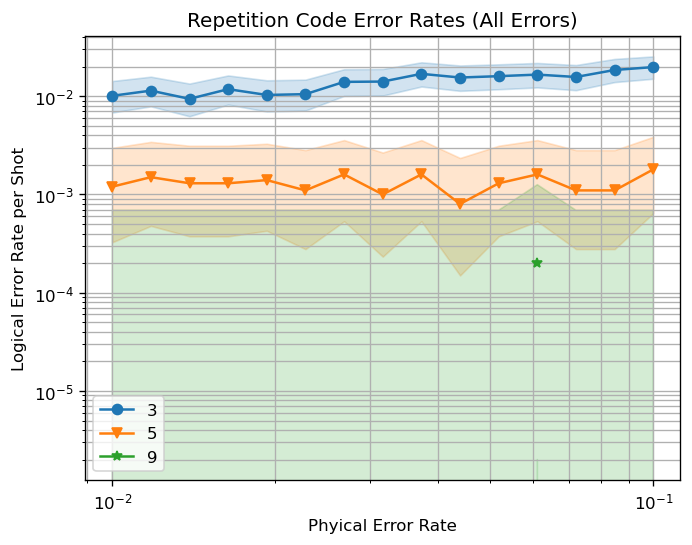

In [ ]:
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (All Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')

ax.grid(which='minor')
ax.legend()
fig.set_dpi(120)  # Show it bigger

In [ ]:

for d in [3,5,9]:
    for hee in heralded_erasure_err_list:
        circuit=single_herald_get_circuit_and_dem(d*3, d, shots, 
                                            0.001, 
                                            hee, 
                                            0.001)['circuit']
        
        task = sinter.Task(
                circuit=circuit,
                # detector_error_model = get_circuit_and_dem(d*3, d, shots, 
                #                             0.01, 
                #                             hee, 
                #                             0)['dem'],
                json_metadata={'p': hee, 'd':d},
                collection_options=sinter.CollectionOptions(max_shots=10**(5), max_errors=10**(5))
            )
        #print(task)
        taskStat = sinter.collect(
            num_workers=4,
            tasks=task,
            decoders=['mwpf'],
            custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circuit) },
            max_shots=10**(5),
            max_errors=10**(5),
            count_detection_events=True
            )
        collected_stats.append(list(taskStat))
        




3


TypeError: 'Task' object is not iterable

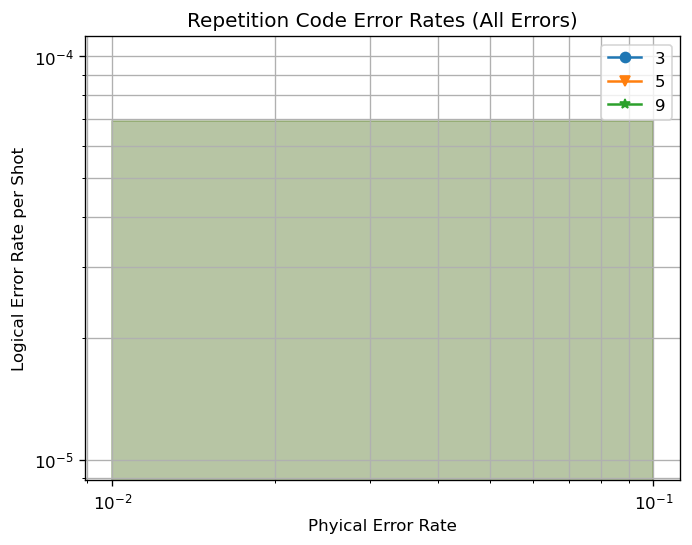

In [ ]:
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (All Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120)  # Show it bigger

In [ ]:
tasks = [
            sinter.Task(
                circuit=single_herald_get_circuit_and_dem(d*3, d, shots, 
                                            0.0001, 
                                            hee, 
                                            0.0002)['circuit'],
                # detector_error_model = get_circuit_and_dem(d*3, d, shots, 
                #                             0.01, 
                #                             hee, 
                #                             0)['dem'],
                json_metadata={'p': hee, 'd':d},
                collection_options=sinter.CollectionOptions(max_shots=10**(5), max_errors=10**(5))

            )
            for d in [3,5,9]
            for hee in heralded_erasure_err_list
        ]



3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9


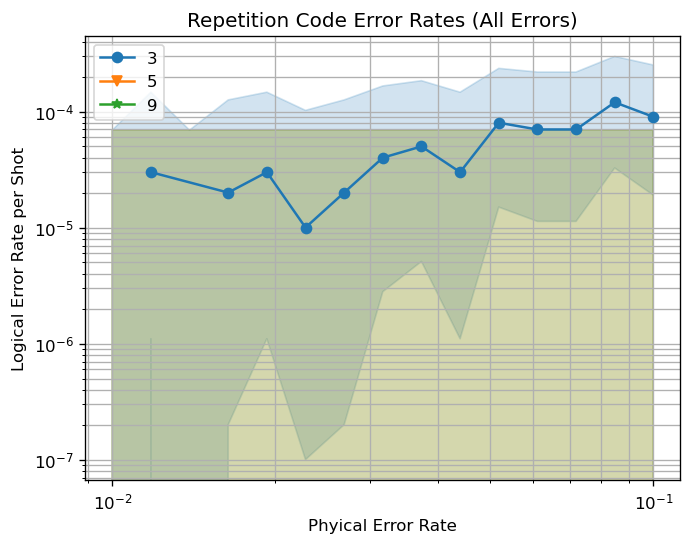

In [ ]:
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (All Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120)  # Show it bigger

In [ ]:
tasks = [
            sinter.Task(
                circuit=single_herald_get_circuit_and_dem(d*3, d, shots, 
                                            0.0001, 
                                            hee, 
                                            0.0002)['circuit'],
                # detector_error_model = get_circuit_and_dem(d*3, d, shots, 
                #                             0.01, 
                #                             hee, 
                #                             0)['dem'],
                json_metadata={'p': hee, 'd':d},
                collection_options=sinter.CollectionOptions(max_shots=10**(5), max_errors=10**(5))

            )
            for d in [3,5,9]
            for hee in heralded_erasure_err_list
        ]

3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9


In [ ]:
collected_stats: List[sinter.TaskStats] = sinter.collect(
    num_workers=4,
    tasks=tasks,
    decoders=['mwpf'],
    custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50) },
    max_shots=10**(5),
    max_errors=10**(5),
    count_detection_events=True
)

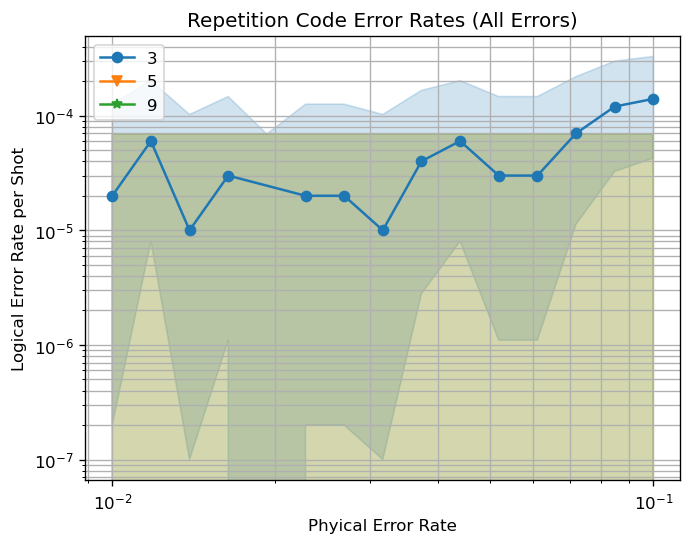

In [ ]:
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (All Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120)  # Show it bigger

In [ ]:
c = get_circuit_and_dem(d*3, d, shots, 
                                            0, 
                                            hee, 
                                            0)['circuit']

dem = c.detector_error_model(approximate_disjoint_errors=True)
decoder = SinterMWPFDecoder(circuit = c)
compiled_decoder = decoder.compile_decoder_for_dem(dem=dem)
# trigger both D0 and D1:
bit_packed_detection_event_data = np.packbits(
    np.array([[1, 1]]), axis=-1, bitorder="little"
)
prediction = compiled_decoder.decode_shots_bit_packed(
    bit_packed_detection_event_data=bit_packed_detection_event_data
)
observables = compiled_decoder.predictor.get_observable_bits(prediction)


decoder.with_circuit(c)
compiled_decoder = decoder.compile_decoder_for_dem(dem=dem)
prediction = compiled_decoder.decode_shots_bit_packed(
    bit_packed_detection_event_data=bit_packed_detection_event_data
)
observables = np.unpackbits(
    prediction[0], count=dem.num_observables, bitorder="little"
)
print(observables)

3
[1]


In [ ]:
cluster_node_limit=50

In [35]:
def generate_example_tasks():
    for p in np.logspace(-2,-1,8):
        for d in [3, 5, 9]:
            yield sinter.Task(
                circuit=single_herald_get_circuit_and_dem(d*3, d, shots, 
                                            10**(-3), 
                                            p, 
                                            10**(-3))['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )



# Collect the samples (takes a few minutes).
collected_stats: List[sinter.TaskStats] = sinter.collect(
    num_workers=4,
    tasks=generate_example_tasks(),
    decoders=['mwpf'],
    custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50) },
    max_shots=10**(5),
    max_errors=10**(5),
    count_detection_events=True
)

# # Print samples as CSV data.
# print(sinter.CSV_HEADER)
# for sample in samples:
#     print(sample.to_csv_line())

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (All Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 





0
1
2
3
4
3
0
1
2
3
4
5
6
7
8
5
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
9
0
1
2
3
4
3
0
1
2
3
4
5
6
7
8
5
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
9
0
1
2
3
4
3
0
1
2
3
4
5
6
7
8
5
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
9
0
1
2
3
4
3
0
1
2
3
4
5
6
7
8
5
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
9
0
1
2
3
4
3
0
1
2
3
4
5
6
7
8
5
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
9
0
1
2
3
4
3
0
1
2
3
4
5
6
7
8
5
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
9
0
1
2
3
4
3
0
1
2
3
4
5
6
7
8
5
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
9
0
1
2
3
4
3
0
1
2
3
4
5
6
7
8
5
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
9


: 

: 

## add more heralded errors

In [12]:
def get_circuit_and_dem(rounds, distance, bit_flip_rate_per_round, heralded_erasure_err, misassign_err):

    meas_len = distance - 1

    all_len = ((2 * distance) - 1)

    erase_len = all_len
    
    qubits = list(range(all_len))

    meas_qubits = list(qubits [1::2])
 
    data_qubits = list(qubits[0::2])

    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("CNOT", cnot1)
    c_i. append_operation ("CNOT", cnot2)
    c_i. append_operation ("MR", meas_qubits, misassign_err)



    coord = distance
    for m in range(meas_len, 0, -1):
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(m))], (coord, 0))
        coord -= 2
        
    

    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    #c_i. append_operation ("DEPOLARIZE1", [0], heralded_erasure_err)
    for q in qubits:
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(q + 1))])
        #print(q)
        # c_i. append_operation ("DETECTOR", [stim.target_rec(-(1))])
    #c_i. append_operation ("MR", meas_qubits, misassign_err)
  
    


    c = stim.Circuit ()
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("CNOT", cnot1)
    c. append_operation ("CNOT", cnot2)
    
    c. append_operation ("MR", meas_qubits, misassign_err)

    #c. append_operation ("SHIFT_COORDS", [], (0,1))


    

    sup = erase_len + meas_len
    coord = distance
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + sup)) ], (coord, 0))
        coord -= 2
    
    

    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    for q in qubits:
        c. append_operation ("DETECTOR", [stim.target_rec(-(q + 1))])
    # c. append_operation ("MR", meas_qubits, misassign_err)
    
    c *= rounds

    c. append_operation ("CNOT", cnot1)
    c. append_operation ("CNOT", cnot2)
    c. append_operation ("MR", data_qubits, misassign_err)

    
    sup = erase_len + meas_len
    coord = distance
    #print(coord)
    ct = 0
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + 1)), stim.target_rec(-(m + sup + 1)) ], (coord, 1))
        coord -= 2
        ct += 1


    #c. append_operation ("MR", meas_qubits, misassign_err)
    #c. append_operation ("HERALDED_ERASE", [0], heralded_erasure_err)
    # c. append_operation ("DETECTOR", [stim.target_rec(-(2))])
    #c. append_operation ("DETECTOR", [stim.target_rec(-(1))])
    # c. append_operation ("DETECTOR", [stim.target_rec(-(1))])
    #c. append_operation ("MR", data_qubits, misassign_err)

        
    #     det_i_1 += 1
    #     det_i_3 += 1
    #     det_i_4 += 1
    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c

    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    c = mwpf.heralded_dem.add_herald_detectors(c)


    return {'circuit': c, 'dem': dem}

### from 10^(-2) to 10^(-1)

In [ ]:
def generate_example_tasks():
    for p in np.logspace(-2,-1,8):
        for d in [3, 5, 9]:
            yield sinter.Task(
                circuit=get_circuit_and_dem(d*3, d, 
                                            10**(-3), 
                                            p, 
                                            10**(-3))['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )



# Collect the samples (takes a few minutes).
collected_stats: List[sinter.TaskStats] = sinter.collect(
    num_workers=4,
    tasks=generate_example_tasks(),
    decoders=['mwpf'],
    custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50) },
    max_shots=10**(5),
    max_errors=10**(5),
    count_detection_events=True
)

# # Print samples as CSV data.
# print(sinter.CSV_HEADER)
# for sample in samples:
#     print(sample.to_csv_line())

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (All Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 





3
5
9
3
5
9
3
5
9
3
5
9
3
5
9
3
5
9
3
5
9
3
5
9


### hopefully improvement?


In [16]:
def generate_circuits():

    for p in np.logspace(-2,-1,8):
        for d in [3, 5, 9]:
            yield get_circuit_and_dem(d*3, d, 
                                            10**(-3), 
                                            p, 
                                            10**(-3))['circuit']

In [17]:
def generate_example_tasks():
    for p in np.logspace(-2,-1,8):
        for d in [3, 5, 9]:
            yield sinter.Task(
                circuit=get_circuit_and_dem(d*3, d, 
                                            10**(-3), 
                                            p, 
                                            10**(-3))['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

In [18]:
print(generate_example_tasks())

print(generate_example_tasks())


<generator object generate_example_tasks at 0x000001EE9EEFE490>
<generator object generate_example_tasks at 0x000001EE9EEFE490>


In [19]:
print(next(generate_circuits()))
print(next(generate_circuits()))


R 0 1 2 3 4
X_ERROR(0.001) 0 1 2 3 4
CX 0 1 2 3 4 3 2 1
MR(0.001) 1 3
DETECTOR(3, 0) rec[-2]
DETECTOR(1, 0) rec[-1]
HERALDED_ERASE(0.01) 0 1 2 3 4
DETECTOR rec[-1]
DETECTOR rec[-2]
DETECTOR rec[-3]
DETECTOR rec[-4]
DETECTOR rec[-5]
X_ERROR(0.001) 0 1 2 3 4
CX 0 1 2 3 4 3 2 1
MR(0.001) 1 3
DETECTOR(3, 0) rec[-2] rec[-9]
DETECTOR(1, 0) rec[-1] rec[-8]
HERALDED_ERASE(0.01) 0 1 2 3 4
DETECTOR rec[-1]
DETECTOR rec[-2]
DETECTOR rec[-3]
DETECTOR rec[-4]
DETECTOR rec[-5]
X_ERROR(0.001) 0 1 2 3 4
CX 0 1 2 3 4 3 2 1
MR(0.001) 1 3
DETECTOR(3, 0) rec[-2] rec[-9]
DETECTOR(1, 0) rec[-1] rec[-8]
HERALDED_ERASE(0.01) 0 1 2 3 4
DETECTOR rec[-1]
DETECTOR rec[-2]
DETECTOR rec[-3]
DETECTOR rec[-4]
DETECTOR rec[-5]
X_ERROR(0.001) 0 1 2 3 4
CX 0 1 2 3 4 3 2 1
MR(0.001) 1 3
DETECTOR(3, 0) rec[-2] rec[-9]
DETECTOR(1, 0) rec[-1] rec[-8]
HERALDED_ERASE(0.01) 0 1 2 3 4
DETECTOR rec[-1]
DETECTOR rec[-2]
DETECTOR rec[-3]
DETECTOR rec[-4]
DETECTOR rec[-5]
X_ERROR(0.001) 0 1 2 3 4
CX 0 1 2 3 4 3 2 1
MR(0.001) 1 3
DE

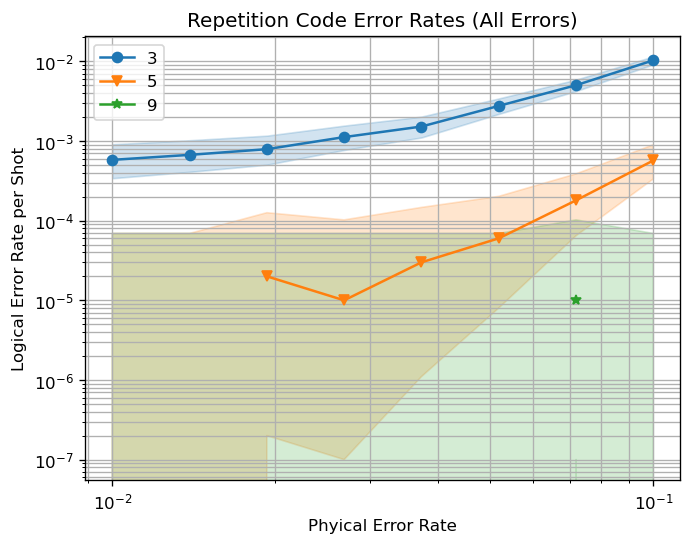

In [30]:

err_list_size = 8
d_list_size = 3
def generate_example_tasks():
    for p in np.logspace(-2,-1,8):
        for d in [3, 5, 9]:
            yield sinter.Task(
                circuit=get_circuit_and_dem(d*3, d, 
                                            10**(-3), 
                                            p, 
                                            10**(-3))['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in np.logspace(-2,-1,8):
        for d in [3, 5, 9]:
            circ_list.append(get_circuit_and_dem(d*3, d, 
                                            10**(-3), 
                                            p, 
                                            10**(-3))['circuit'])
    return circ_list
  




# # Collect the samples (takes a few minutes).
# collected_stats: List[sinter.TaskStats] = sinter.collect(
#     num_workers=4,
#     tasks=generate_example_tasks(),
#     decoders=['mwpf'],
#     custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(next(generate_circuits())) },
#     max_shots=10**(5),
#     max_errors=10**(5),
#     count_detection_events=True
# )

collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=10**(5),
        max_errors=10**(5),
        count_detection_events=True
        )
    collected_stats = collected_stats + collected_stat 
    t+=1




# # Print samples as CSV data.
# print(sinter.CSV_HEADER)
# for sample in samples:
#     print(sample.to_csv_line())

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (All Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 





### from 10^(-4) to 10^(-1)

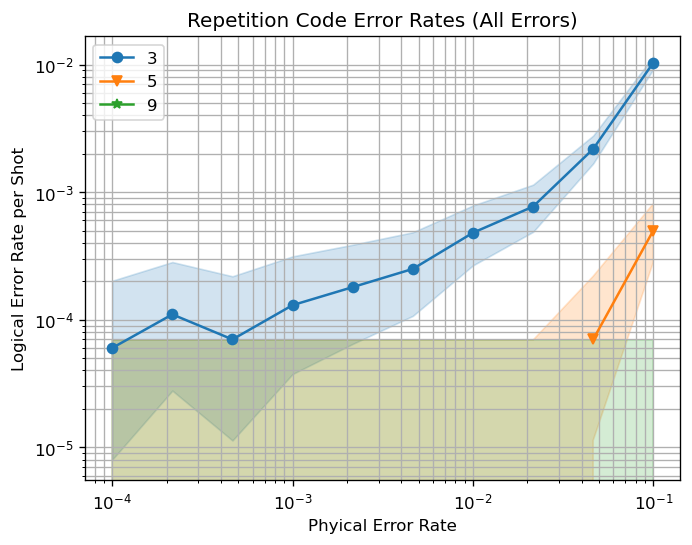

In [32]:
err_list_size = 10
d_list_size = 3

def generate_example_tasks():
    for p in np.logspace(-4,-1, err_list_size):
        for d in [3, 5, 9]:
            yield sinter.Task(
                circuit=get_circuit_and_dem(d*3, d, 
                                            10**(-3), 
                                            p, 
                                            10**(-3))['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in np.logspace(-4,-1, err_list_size):
        for d in [3, 5, 9]:
            circ_list.append(get_circuit_and_dem(d*3, d, 
                                            10**(-3), 
                                            p, 
                                            10**(-3))['circuit'])
    return circ_list
  


# # Collect the samples (takes a few minutes).
# collected_stats: List[sinter.TaskStats] = sinter.collect(
#     num_workers=4,
#     tasks=generate_example_tasks(),
#     decoders=['mwpf'],
#     custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50) },
#     max_shots=10**(5),
#     max_errors=10**(5),
#     count_detection_events=True
# )


collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=10**(5),
        max_errors=10**(5),
        count_detection_events=True
        )
    collected_stats = collected_stats + collected_stat 
    t+=1


# # Print samples as CSV data.
# print(sinter.CSV_HEADER)
# for sample in samples:
#     print(sample.to_csv_line())

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (All Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 





## Only Heralded errors

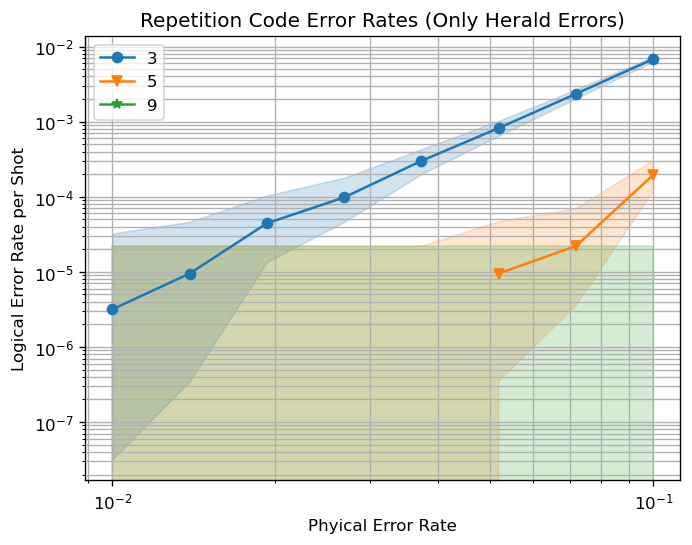

In [ ]:
err_list_size = 8
d_list_size = 3

err_list = np.logspace(-2,-1,8)

def generate_example_tasks():
    for p in err_list:
        for d in [3, 5, 9]:
            yield sinter.Task(
                circuit=get_circuit_and_dem(d*3, d, 
                                            0, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_example_tasks():
    for p in err_list:
        for d in [3, 5, 9]:
            yield sinter.Task(
                circuit=get_circuit_and_dem(d*3, d,  
                                            0, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in [3, 5, 9]:
            circ_list.append(get_circuit_and_dem(d*3, d, 
                                            0, 
                                            p, 
                                            0)['circuit'])
    return circ_list


# # Collect the samples (takes a few minutes).
# collected_stats: List[sinter.TaskStats] = sinter.collect(
#     num_workers=4,
#     tasks=generate_example_tasks(),
#     decoders=['mwpf'],
#     custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50) },
#     max_shots=10**(6),
#     max_errors=10**(4),
#     count_detection_events=True
# )

collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(5.5)),
        max_errors=int(10**(5.5)),
        count_detection_events=True
        )
    collected_stats = collected_stats + collected_stat 
    t+=1



# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Only Herald Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 



In [ ]:
# # Print samples as CSV data.
# print(sinter.CSV_HEADER)
for sample in collected_stats:
    print(sample.to_csv_line())

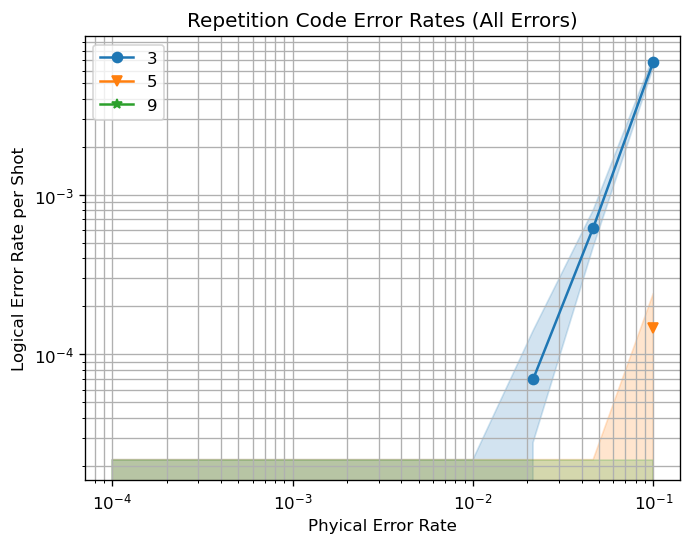

In [ ]:
err_list_size = 10
d_list_size = 3

err_list = np.logspace(-4,-1,10)

def generate_example_tasks():
    for p in err_list:
        for d in [3, 5, 9]:
            yield sinter.Task(
                circuit=get_circuit_and_dem(d*3, d, 
                                            0, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )


def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in [3, 5, 9]:
            circ_list.append(get_circuit_and_dem(d*3, d, 
                                            0, 
                                            p, 
                                            0)['circuit'])
    return circ_list


# # Collect the samples (takes a few minutes).
# collected_stats: List[sinter.TaskStats] = sinter.collect(
#     num_workers=4,
#     tasks=generate_example_tasks(),
#     decoders=['mwpf'],
#     custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50) },
#     max_shots=10**(6),
#     max_errors=10**(6),
#     count_detection_events=True
# )


collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(5.5)),
        max_errors=int(10**(5.5)),
        count_detection_events=True
        )
    collected_stats = collected_stats + collected_stat 
    t+=1

# # Print samples as CSV data.
# print(sinter.CSV_HEADER)
# for sample in samples:
#     print(sample.to_csv_line())

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Only Herald Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 





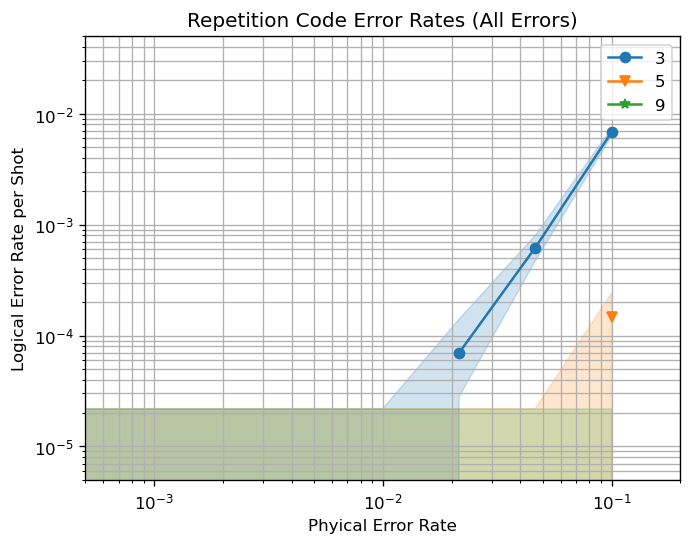

In [ ]:

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
ax.set_ylim(5e-6, 5e-2)
ax.set_xlim(5e-4, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Only Herald Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

In [12]:
# # Print samples as CSV data.
# print(sinter.CSV_HEADER)
for sample in collected_stats:
    print(sample.to_csv_line())

    100000,         0,         0,    2.70,mwpf,fa9c0d87722dbc2d461d1887a344c7066d11475252136e1e4a87e62e173b8785,"{""d"":3,""p"":0.00021544346900318845}","{""detection_events"":1881,""detectors_checked"":7200000}"
    100000,         0,         0,    2.73,mwpf,28a146b096696fce1682b870290dd2851e77f6c548e538f01c92de5083b2a910,"{""d"":3,""p"":0.0001}","{""detection_events"":816,""detectors_checked"":7200000}"
    100000,         0,         0,    5.19,mwpf,1da69cce256df6e8292737ea7003f7d42b02952101afd83665da7df25df2b99b,"{""d"":5,""p"":0.0001}","{""detection_events"":2586,""detectors_checked"":21200000}"
    100000,         0,         0,    9.97,mwpf,24d27c33d64058c6889085117f4887b14cbba8160a9d56c3b1ce319ae227dc57,"{""d"":9,""p"":0.0001}","{""detection_events"":9381,""detectors_checked"":70800000}"
    100000,         0,         0,    5.08,mwpf,07ed9af120d0abea86f1efff5d087f0fe9c288668a06e0755b7a7b7c19cb92f9,"{""d"":5,""p"":0.00021544346900318845}","{""detection_events"":5841,""detectors_ch

In [ ]:
# try adding postselected_detectors_predicate = True to sinter.collect

# Heralded erasures with dependent bitflip noise

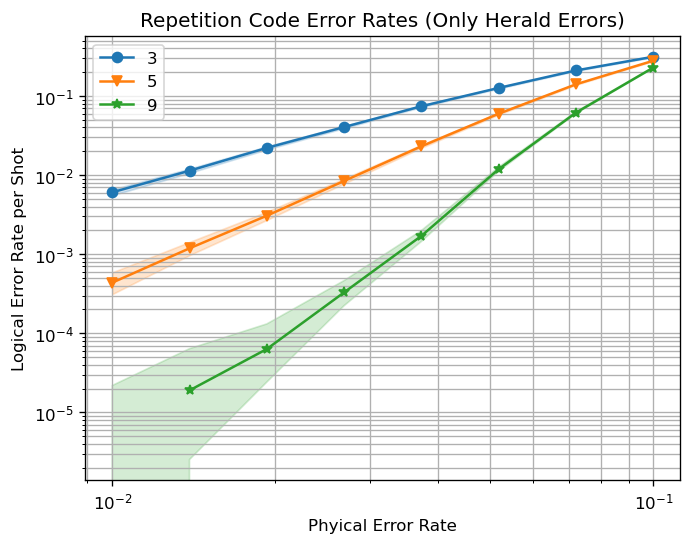

In [ ]:
err_list_size = 8
d_list_size = 3

err_list = np.logspace(-2,-1,8)

def generate_example_tasks():
    for p in err_list:
        for d in [3, 5, 9]:
            yield sinter.Task(
                circuit=get_circuit_and_dem(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in [3, 5, 9]:
            circ_list.append(get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list


# # Collect the samples (takes a few minutes).
# collected_stats: List[sinter.TaskStats] = sinter.collect(
#     num_workers=4,
#     tasks=generate_example_tasks(),
#     decoders=['mwpf'],
#     custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50) },
#     max_shots=10**(6),
#     max_errors=10**(4),
#     count_detection_events=True
# )

collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(5.5)),
        max_errors=int(10**(5.5)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1


# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 



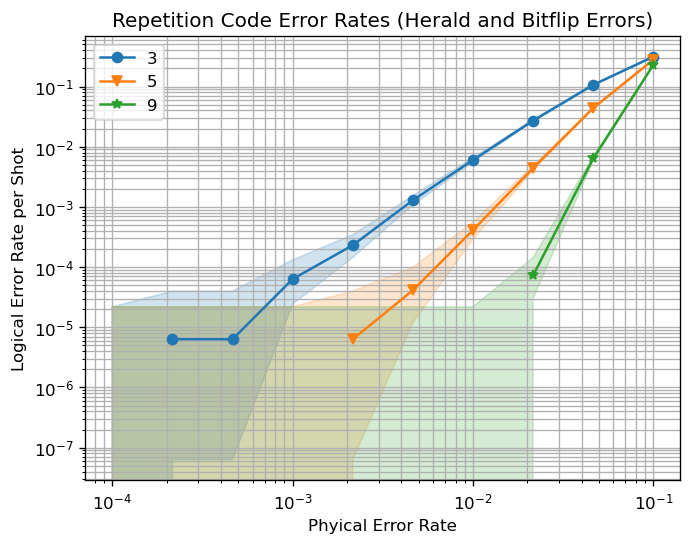

In [57]:
err_list_size = 10
d_list_size = 3

err_list = np.logspace(-4,-1,10)

def generate_example_tasks():
    for p in err_list:
        for d in [3, 5, 9]:
            yield sinter.Task(
                circuit=get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )


def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in [3, 5, 9]:
            circ_list.append(get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list


# # Collect the samples (takes a few minutes).
# collected_stats: List[sinter.TaskStats] = sinter.collect(
#     num_workers=4,
#     tasks=generate_example_tasks(),
#     decoders=['mwpf'],
#     custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50) },
#     max_shots=10**(6),
#     max_errors=10**(6),
#     count_detection_events=True
# )


collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(5.5)),
        max_errors=int(10**(5.5)),
        count_detection_events=True
        )
    collected_stats = collected_stats + collected_stat 
    t+=1

# # Print samples as CSV data.
# print(sinter.CSV_HEADER)
# for sample in samples:
#     print(sample.to_csv_line())

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

# Level 3 Heralded Erasures 

In [31]:
def get_herald_subcircuit(qubits: Iterable, erase_len: int, heralded_erasure_err):
    # Error checking
    if erase_len != len(qubits):
        raise ValueError("erase_len and detection qubit number do not match")
    

    circuit = stim.Circuit()
    circuit. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    for q in qubits:
        circuit. append_operation ("DETECTOR", [stim.target_rec(-(q + 1))])
    

    
    return circuit

In [14]:
def level_3_get_circuit_and_dem(rounds, distance, bit_flip_rate_per_round, heralded_erasure_err, misassign_err):

    # initialize circuit info
    meas_len = distance - 1
    all_len = ((2 * distance) - 1)
    erase_len = all_len
    
    qubits = list(range(all_len))
    meas_qubits = list(qubits [1::2])
    data_qubits = list(qubits[0::2])

    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("CNOT", cnot1)
    c_i. append_operation ("CNOT", cnot2)

    #
    c_i = c_i + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    

    c_i. append_operation ("MR", meas_qubits, misassign_err)

    coord = distance
    for m in range(meas_len, 0, -1):
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(m))], (coord, 0))
        coord -= 2
        
    

    c_i = c_i + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    


    c = stim.Circuit ()
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("CNOT", cnot1)
    c. append_operation ("CNOT", cnot2)

    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    
    c. append_operation ("MR", meas_qubits, misassign_err)

    #c. append_operation ("SHIFT_COORDS", [], (0,1))


    

    sup = 2*erase_len + meas_len
    coord = distance
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + sup)) ], (coord, 0))
        coord -= 2
    
    

    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    
    c *= rounds

    c. append_operation ("CNOT", cnot1)
    c. append_operation ("CNOT", cnot2)

    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)

    c. append_operation ("MR", data_qubits, misassign_err)

    
    sup = 2*erase_len + meas_len
    coord = distance
    #print(coord)
    ct = 0
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + 1)), stim.target_rec(-(m + sup + 1)) ], (coord, 1))
        coord -= 2
        ct += 1

    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c

    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    c = mwpf.heralded_dem.add_herald_detectors(c)


    return {'circuit': c, 'dem': dem}

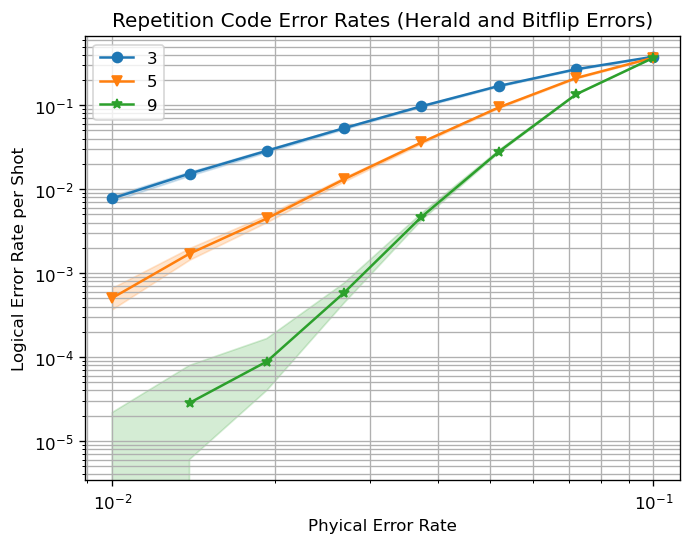

In [64]:
err_list_size = 8
d_list_size = 3

err_list = np.logspace(-2,-1,8)

def generate_example_tasks():
    for p in err_list:
        for d in [3, 5, 9]:
            yield sinter.Task(
                circuit=level_3_get_circuit_and_dem(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in [3, 5, 9]:
            circ_list.append(level_3_get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(5.5)),
        max_errors=int(10**(5.5)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1


# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


# Level 4 Heralded Erasures

In [15]:
def level_4_get_circuit_and_dem(rounds, distance, bit_flip_rate_per_round, heralded_erasure_err, misassign_err):

    # initialize circuit info
    meas_len = distance - 1
    all_len = ((2 * distance) - 1)
    erase_len = all_len
    
    qubits = list(range(all_len))
    meas_qubits = list(qubits [1::2])
    data_qubits = list(qubits[0::2])

    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )

    ### CNOTS
    c_i. append_operation ("CNOT", cnot1)
    # HERALD DET
    c_i = c_i + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    c_i. append_operation ("CNOT", cnot2)

    # HERALD DET
    c_i = c_i + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    
    # BITFLIP DET
    c_i. append_operation ("MR", meas_qubits, misassign_err)
    coord = distance
    for m in range(meas_len, 0, -1):
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(m))], (coord, 0))
        coord -= 2
        
    
    # HERALD DET
    c_i = c_i + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    


    c = stim.Circuit ()
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # HERALD DET
    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # HERALD DET
    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    
    # BITFLIP DET
    c. append_operation ("MR", meas_qubits, misassign_err)
    sup = 3*erase_len + meas_len
    coord = distance
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + sup)) ], (coord, 0))
        coord -= 2
    
    
    # HERALD DET
    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    
    c *= rounds

    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # HERALD DET
    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # HERALD DET
    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)

    # BITFLIP DET
    c. append_operation ("MR", data_qubits, misassign_err)
    sup = 3*erase_len + meas_len
    coord = distance
    ct = 0
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + 1)), stim.target_rec(-(m + sup + 1)) ], (coord, 1))
        coord -= 2
        ct += 1

    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c

    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    c = mwpf.heralded_dem.add_herald_detectors(c)


    return {'circuit': c, 'dem': dem}

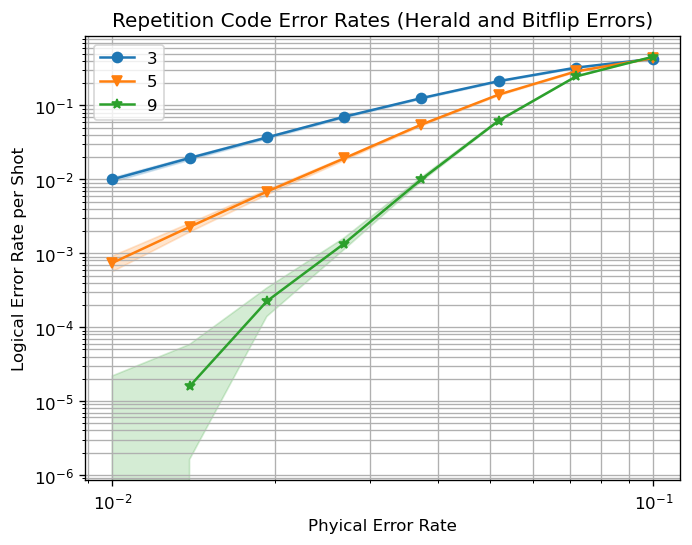

In [16]:
err_list_size = 8
d_list_size = 3

err_list = np.logspace(-2,-1,8)

def generate_example_tasks():
    for p in err_list:
        for d in [3, 5, 9]:
            yield sinter.Task(
                circuit=level_4_get_circuit_and_dem(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in [3, 5, 9]:
            circ_list.append(level_4_get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(5.5)),
        max_errors=int(10**(5.5)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1


# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


# Speeding up simulation (bringing pymatching back in)

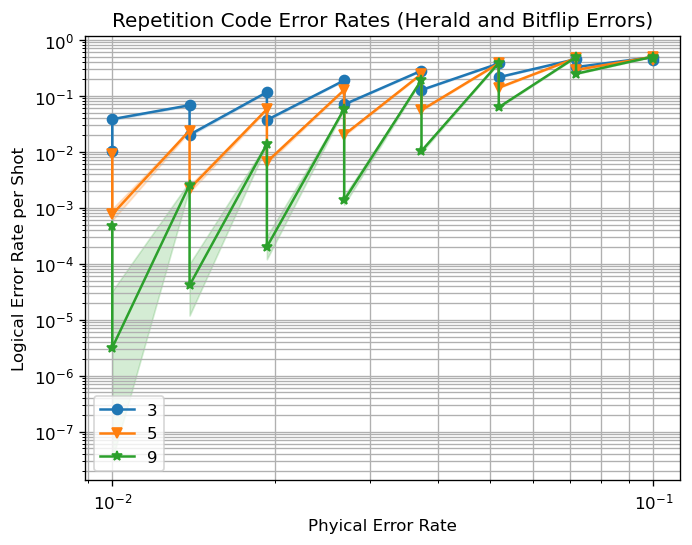

In [18]:
err_list_size = 8
d_list_size = 3

err_list = np.logspace(-2,-1,8)
d_list = [3, 5, 9]

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=level_4_get_circuit_and_dem(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(level_4_get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf', 'pymatching'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(5.5)),
        max_errors=int(10**(5.5)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1


# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


# Comparison to threshold results in Kubica paper

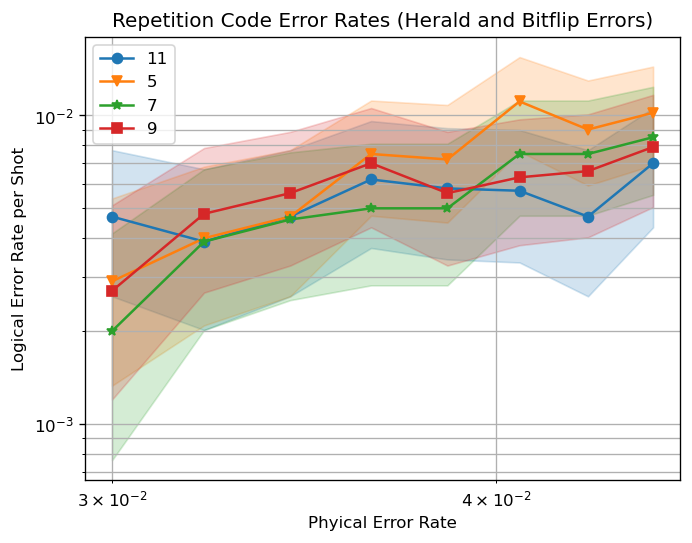

In [17]:
err_list_size = 8
d_list_size = 4

err_list = np.linspace(0.03,0.045,err_list_size)
d_list = [5, 7, 9, 11]

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=level_4_get_circuit_and_dem(d*3, d,  
                                            0.0007, 
                                            p, 
                                            (2/3)*p)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(level_4_get_circuit_and_dem(d*3, d, 
                                            0.0007, 
                                            p, 
                                            (2/3)*p)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1


# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


# Functions to find exact threshold

In [7]:
from scipy.optimize import curve_fit
from numpy import exp, pi, sqrt
import lmfit
from lmfit import Model

from math import log

In [8]:
def decay2(x, a, b, p):
    y = a * (1 - p**x) +b
    return y

In [9]:
def linmod(x, a, b):
    y = a * x + b
    return y

In [10]:


def make_func(many_dicts:List, d_list_size, guess):
    intercepts = []

    for sh in range(100):
        random.shuffle(many_dicts)
        x_rand_guess = random.uniform(guess[0][0], guess[0][1])
        y_rand_guess = random.uniform(guess[1][0], guess[1][1])
        new_guess = [x_rand_guess, y_rand_guess]
        #print("new_guess", new_guess)
        for i in range(0, d_list_size):
            dict1 = many_dicts[i % d_list_size]
            dict2 = many_dicts[(i + 1) % d_list_size]

            # print(dict1)
            # print(dict2)
            def func(inputs):
                x = inputs[0]
                y = inputs[1]
                eq1 = dict1['a'] * (1 - dict1['p']**x + dict1['b']) - y
                eq2 = dict2['a'] * (1 - dict2['p']**x + dict2['b']) - y
                return [eq1, eq2]
            intercept = fsolve(func, new_guess)
            # sanity check-- error cannot exceed 1 aka 10^0
            if (intercept[0] < 0) and (intercept[1] < 0):
                intercepts.append(intercept)
    
    return intercepts


### find exact threshold

In [11]:
def find_exact_threshold(collected_stats, phys_err_list, err_list_size:int, d_list_size:int, show_init: bool, a_list, p_list, show_plots = True):
    group_func=lambda collected_stats: collected_stats.json_metadata['d']
    grouped_stats = sinter.group_by(collected_stats, key = group_func)
    print(grouped_stats)
    print(grouped_stats[3][0].errors)
    print(len(grouped_stats[3]))

    decay_model = Model(decay2)
    decay_model.set_param_hint('p', min=0.0, max = 1)
    params = decay_model.make_params()

    
    result_list = []
    many_dicts = []


    # maybe include plots with results 
    # logify
    
    #log_phys_err_list = np.log(phys_err_list)
    count = 0
    fig, ax = plt.subplots(1, 1)
    for d in grouped_stats:
        log_grouped_stats_d = []
        log_phys_err_list = []
        for i in range(len(grouped_stats[d])):
            print("errors", grouped_stats[d][i].errors) 
            print("shots", grouped_stats[d][i].shots) 
            print("distance", grouped_stats[d][i].json_metadata['p'])
            print("log_err_rate", Decimal(grouped_stats[d][i].errors / grouped_stats[d][i].shots ))
            log_grouped_stats_d.append( Decimal(grouped_stats[d][i].errors / grouped_stats[d][i].shots ))
            log_phys_err_list.append(grouped_stats[d][i].json_metadata['p'])
            
        result = decay_model.fit(log_grouped_stats_d, x=np.array(list(log_phys_err_list)), a = a_list[count], b = 0, p = p_list[count])
        var_dict = {}
        print(result.fit_report())

        if show_plots == True:
            plt.plot(log_phys_err_list, log_grouped_stats_d, 'o', label = d)
            if show_init == True:
                plt.plot(log_phys_err_list, result.init_fit, '--', label='initial fit')
            plt.plot(log_phys_err_list, result.best_fit, '-', label='best fit')
            
        print(result.best_values['a'])
        
        result_list.append(result)
        var_dict.update({'a': result.best_values['a']})
        var_dict.update({'b': result.best_values['b']})
        var_dict.update({'p': result.best_values['p']})
        many_dicts.append(var_dict)
        #print(count)
        count += 1

    ax.loglog()
    ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
    ax.set_xlabel("Phyical Error Rate")
    ax.set_ylabel("Logical Error Rate per Shot")
    ax.grid(which='major')
    ax.grid(which='minor')
    ax.legend()
    plt.show()
    
    intercepts = make_func(many_dicts, d_list_size, [9*10**(-1), 5*10**(-1)])

    print(intercepts)
    
    mean_threshold = np.mean([i[0] for i in intercepts])

    print("threshold", mean_threshold)

    return mean_threshold

### log find exact threshold

In [12]:
def log_find_exact_threshold(collected_stats, phys_err_list ,
                             err_list_size:int, d_list_size:int, 
                             show_init: bool, 
                             a_list, 
                             p_list, 
                             guess:List, 
                             show_plots = True,
                             show_fit_report = False,
                             show_threshold_line = True):
    group_func=lambda collected_stats: collected_stats.json_metadata['d']
    grouped_stats = sinter.group_by(collected_stats, key = group_func)
    


    decay_model = Model(decay2)
    decay_model.set_param_hint('p', min=0.0, max = 1)
    params = decay_model.make_params()

    
    result_list = []
    many_dicts = []


    # maybe include plots with results 
    # logify
    
    #log_phys_err_list = np.log(phys_err_list)
    count = 0
    fig, ax = plt.subplots(1, 1)
    for d in grouped_stats:
        # get size of list per distance
        gsd_size = len(grouped_stats[d])

        log_grouped_stats_d = []
        log_phys_err_list = []
        sub = 0
        for i in range(gsd_size ):
            # print("logical_err_rate", Decimal(grouped_stats[d][i].errors / grouped_stats[d][i].shots ))
            logical_err = Decimal(grouped_stats[d][i].errors / grouped_stats[d][i].shots )
            if logical_err < sys.float_info.min:
                sub += 1
                continue
            log_grouped_stats_d.append( log(logical_err, 10))
            log_phys_err_list.append(log(grouped_stats[d][i].json_metadata['p'], 10))
        
        gsd_size -= sub
            
        result = decay_model.fit(log_grouped_stats_d, 
                                 x=np.array(list(log_phys_err_list)), 
                                 a = a_list[count % gsd_size ], 
                                 b = 0, 
                                 p = p_list[count % gsd_size ])
        var_dict = {}
        if show_fit_report == True:
            print(result.fit_report())

        if show_plots == True:
            plt.plot(log_phys_err_list, log_grouped_stats_d, 'o', label = d, color = cmap[count % gsd_size])
            if show_init == True:
                plt.plot(log_phys_err_list, result.init_fit, '--', label='initial fit')
            plt.plot(log_phys_err_list, result.best_fit, '--', label='best fit', color = cmap[count % gsd_size])
            
        #print(result.best_values['a'])
        
        result_list.append(result)
        var_dict.update({'a': result.best_values['a']})
        var_dict.update({'b': result.best_values['b']})
        var_dict.update({'p': result.best_values['p']})
        many_dicts.append(var_dict)
        #print(count)
        count += 1

    # ax.loglog()
    
    
    
    intercepts = make_func(many_dicts, d_list_size, guess)

    # print(intercepts)
    # print([i[0] for i in intercepts])
    
    mean_threshold_log = np.mean([i[0] for i in intercepts])
    raw_mean_threshold = 10**(mean_threshold_log)

    print(f"\nThe log scaled threshold is {mean_threshold_log}\n The raw threshold is {raw_mean_threshold}")

    ax.set_title("Surface Code Error Rates (Phase and Bitflip Errors)")
    ax.set_xlabel("Phyical Error Rate")
    ax.set_ylabel("Logical Error Rate per Shot")
    ax.grid(which='major')
    ax.grid(which='minor')
    ax.legend()
    if show_threshold_line == True:
        plt.vlines(mean_threshold_log, ymin = -4, ymax = 0, color = "red", label = f"{10**mean_threshold_log}")
    plt.show()

    return mean_threshold_log

In [13]:
def find_deff(collected_stats, phys_err_list, err_list_size:int, d_list_size:int, show_init: bool, a_list, p_list, show_plots = True):
    group_func=lambda collected_stats: collected_stats.json_metadata['d']
    grouped_stats = sinter.group_by(collected_stats, key = group_func)

    decay_model = Model(linmod)
    decay_model.set_param_hint('p', min=0.0, max = 1)
    params = decay_model.make_params()

    count = 0
    result_list = []
    many_dicts = []

    # logify
    log_grouped_stats = np.log(grouped_stats)
    log_phys_err_list = np.log(phys_err_list)

    for d in grouped_stats:
        result = decay_model.fit(log_grouped_stats [d], x=np.array(list(log_phys_err_list)), a = a_list[count], b = 0, p = p_list[count])
        var_dict = {}
        print(result.fit_report())

        if show_plots == True:
            plt.plot(log_phys_err_list, log_grouped_stats[d], 'o', label = d)
            if show_init == True:
                plt.plot(log_phys_err_list, result.init_fit, '--', label='initial fit')
            plt.plot(log_phys_err_list, result.best_fit, '-', label='best fit', color = "green")
            plt.title(f"Logical Err Rate per Shot vs. Erasure noise for Rep Code")
            plt.xlabel("Physical Err Rate")
            plt.ylabel("Logical Err Rate per Shot")
            plt.legend()
            plt.show()

        result_list.append(result)
        var_dict.update({'a': result.a})
        var_dict.update({'b': result.b})
        many_dicts.append(var_dict)
        #print(count)
        count += 1

    return many_dicts



        
    

# Level 5--Errors can be everywhere!

In [14]:
def one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len: int, heralded_erasure_err):

    circuit = stim.Circuit()
    
    circuit. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    for q in erase_qubits:
        circuit. append_operation ("DETECTOR", [stim.target_rec(-(q + 1))])

    return circuit

## One Heralded erasure detector

In [12]:
def one_det_get_circuit_and_dem(rounds, distance, bit_flip_rate_per_round, heralded_erasure_err, misassign_err):

    # initialize circuit info
    meas_len = distance - 1
    all_len = ((2 * distance) - 1)
    erase_len = all_len
    
    qubits = list(range(all_len))
    meas_qubits = list(qubits [1::2])
    data_qubits = list(qubits[0::2])
    erase_qubits = list(range(0,all_len*3))

    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    
    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    ### CNOTS
    c_i. append_operation ("CNOT", cnot1)
    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    c_i. append_operation ("CNOT", cnot2)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    
    # BITFLIP DET
    c_i. append_operation ("MR", meas_qubits, misassign_err)
    coord = distance
    for m in range(meas_len, 0, -1):
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(m))], (coord, 0))
        coord -= 2
        
    


    c = stim.Circuit ()
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )  
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    
    # BITFLIP DET
    c. append_operation ("MR", meas_qubits, misassign_err)
    sup = 3*erase_len + meas_len
    coord = distance
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + sup)) ], (coord, 0))
        coord -= 2
    

    c *= rounds

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)

    # BITFLIP DET
    c. append_operation ("MR", data_qubits, misassign_err)
    sup = 3*erase_len + meas_len
    coord = distance
    ct = 0
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + 1)), stim.target_rec(-(m + sup + 1)) ], (coord, 1))
        coord -= 2
        ct += 1

    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c

    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    c = mwpf.heralded_dem.add_herald_detectors(c)


    return {'circuit': c, 'dem': dem}

In [14]:
exc = one_det_get_circuit_and_dem(3*3, 3,  
                                            (2/3)*0.01, 
                                            0.01, 
                                            0)['circuit']

exc.to_file("exc")

In [15]:
err_list_size = 8
d_list_size = 3

err_list = np.logspace(-3,-1,8)
d_list = [3, 5, 9]

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=one_det_get_circuit_and_dem(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(one_det_get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(5.5)),
        max_errors=int(10**(5.5)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1


# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


RuntimeError: Worker failed: traceback=Traceback (most recent call last):
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\sinter\_collection\_collection_worker_state.py", line 246, in run_message_loop
    did_some_work = self.do_some_work()
                    ^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\sinter\_collection\_collection_worker_state.py", line 217, in do_some_work
    some_work_done = self.compiled_sampler.sample(self.current_task_shots_left)
                     ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\sinter\_collection\_sampler_ramp_throttled.py", line 51, in sample
    result = self.sub_sampler.sample(actual_shots)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\sinter\_decoding\_stim_then_decode_sampler.py", line 216, in sample
    return AnonTaskStats(
           ^^^^^^^^^^^^^^
  File "<string>", line 8, in __init__
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\sinter\_data\_anon_task_stats.py", line 37, in __post_init__
    assert isinstance(self.errors, int)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError


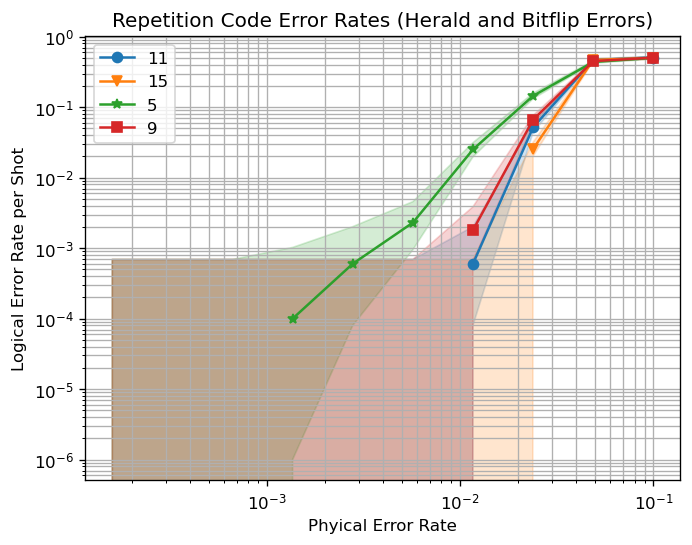

In [ ]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-3.8,-1, err_list_size)
d_list = [5, 9, 11, 15]

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=one_det_get_circuit_and_dem(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(one_det_get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1

one_det_stats = collected_stats
# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 




In [ ]:
err_list = np.logspace(-2, -1, 8)
print(err_list)
print([(2 * 10**(-2)), (4 * 10**(-2))])
print([(10**(-1.8)), (10**(-1.4))])
err_list = np.logspace(-1.8, -1.4, 8)

[0.01       0.01389495 0.01930698 0.02682696 0.03727594 0.05179475
 0.07196857 0.1       ]
[0.02, 0.04]
[0.015848931924611134, 0.039810717055349734]


## Two Heralded erasure detectors

### Between CNOTs and before measurement

In [14]:
def two_det_get_circuit_and_dem(rounds, distance, bit_flip_rate_per_round, heralded_erasure_err, misassign_err):

    # initialize circuit info
    meas_len = distance - 1
    all_len = ((2 * distance) - 1)
    erase_len = all_len
    
    qubits = list(range(all_len))
    meas_qubits = list(qubits [1::2])
    data_qubits = list(qubits[0::2])
    erase_qubits_1 = list(range(0,all_len*2))
    erase_qubits_2 = qubits

    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    ### CNOTS
    c_i. append_operation ("CNOT", cnot1)
    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits_1, qubits, erase_len, heralded_erasure_err)
    
    c_i. append_operation ("CNOT", cnot2)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits_2, qubits, erase_len, heralded_erasure_err)
    
    # BITFLIP DET
    c_i. append_operation ("MR", meas_qubits, misassign_err)
    coord = distance
    for m in range(meas_len, 0, -1):
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(m))], (coord, 0))
        coord -= 2
        
    


    c = stim.Circuit ()
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits_1, qubits, erase_len, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )  
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits_2, qubits, erase_len, heralded_erasure_err)
    
    # BITFLIP DET
    c. append_operation ("MR", meas_qubits, misassign_err)
    sup = 3*erase_len + meas_len
    coord = distance
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + sup)) ], (coord, 0))
        coord -= 2
    

    c *= rounds

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits_1, qubits, erase_len, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits_2, qubits, erase_len, heralded_erasure_err)

    # BITFLIP DET
    c. append_operation ("MR", data_qubits, misassign_err)
    sup = 3*erase_len + meas_len
    coord = distance
    ct = 0
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + 1)), stim.target_rec(-(m + sup + 1)) ], (coord, 1))
        coord -= 2
        ct += 1

    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c

    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    c = mwpf.heralded_dem.add_herald_detectors(c)


    return {'circuit': c, 'dem': dem}

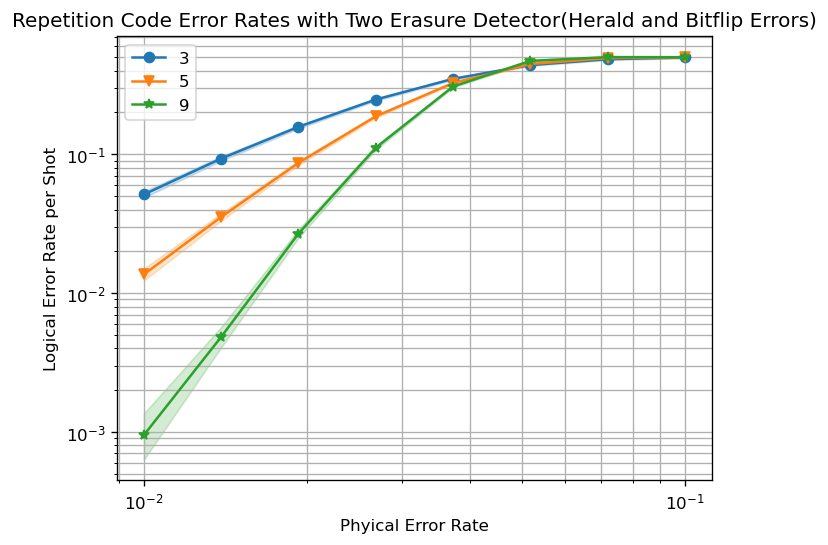

In [10]:
err_list_size = 8
d_list_size = 3

err_list = np.logspace(-2,-1,8)
d_list = [3, 5, 9]

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(5)),
        max_errors=int(10**(5)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1


# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates with Two Erasure Detector(Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


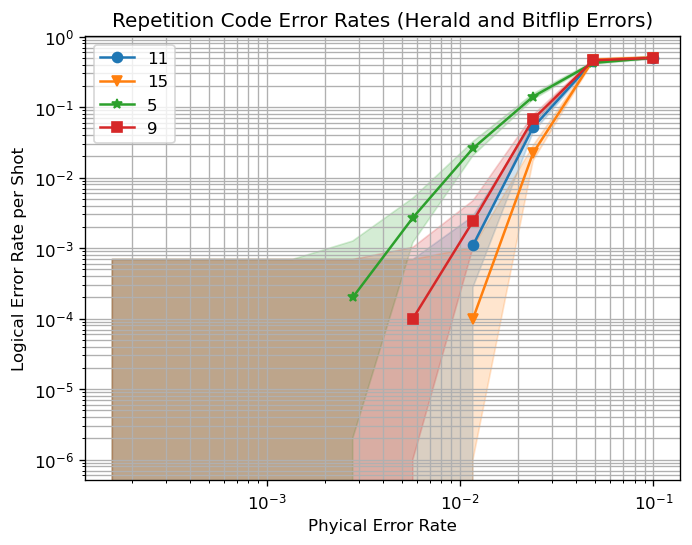

In [ ]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-3.8,-1, err_list_size)
d_list = [5, 9, 11, 15]

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1

two_det_stats = collected_stats
# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


In [7]:
err_list_size = 8
d_list_size = 3

err_list = np.logspace((8 * 10**(-2)), (4 * 10**(-2)), 8, base=1)
d_list = [3, 5, 9]

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1

two_det_stats = collected_stats
# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


NameError: name 'two_det_get_circuit_and_dem' is not defined

### Before and After CNOT

In [15]:
def two_det_get_circuit_and_dem_2(rounds, distance, bit_flip_rate_per_round, heralded_erasure_err, misassign_err):

    # initialize circuit info
    meas_len = distance - 1
    all_len = ((2 * distance) - 1)
    erase_len = all_len
    
    qubits = list(range(all_len))
    meas_qubits = list(qubits [1::2])
    data_qubits = list(qubits[0::2])
    erase_qubits_1 = qubits
    erase_qubits_2 = list(range(0,all_len*2))

    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits_1, qubits, erase_len, heralded_erasure_err)

    ### CNOTS
    c_i. append_operation ("CNOT", cnot1)
    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    c_i. append_operation ("CNOT", cnot2)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits_2, qubits, erase_len, heralded_erasure_err)
    
    # BITFLIP DET
    c_i. append_operation ("MR", meas_qubits, misassign_err)
    coord = distance
    for m in range(meas_len, 0, -1):
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(m))], (coord, 0))
        coord -= 2
        
    


    c = stim.Circuit ()
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits_1, qubits, erase_len, heralded_erasure_err)
    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )  
    # HERALD + DET
    c = c +  one_time_get_herald_subcircuit(erase_qubits_2, qubits, erase_len, heralded_erasure_err)
    
    # BITFLIP DET
    c. append_operation ("MR", meas_qubits, misassign_err)
    sup = 3*erase_len + meas_len
    coord = distance
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + sup)) ], (coord, 0))
        coord -= 2
    

    c *= rounds

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits_1, qubits, erase_len, heralded_erasure_err)

    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c +  one_time_get_herald_subcircuit(erase_qubits_2, qubits, erase_len, heralded_erasure_err)

    # BITFLIP DET
    c. append_operation ("MR", data_qubits, misassign_err)
    sup = 3*erase_len + meas_len
    coord = distance
    ct = 0
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + 1)), stim.target_rec(-(m + sup + 1)) ], (coord, 1))
        coord -= 2
        ct += 1

    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c

    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    c = mwpf.heralded_dem.add_herald_detectors(c)


    return {'circuit': c, 'dem': dem}

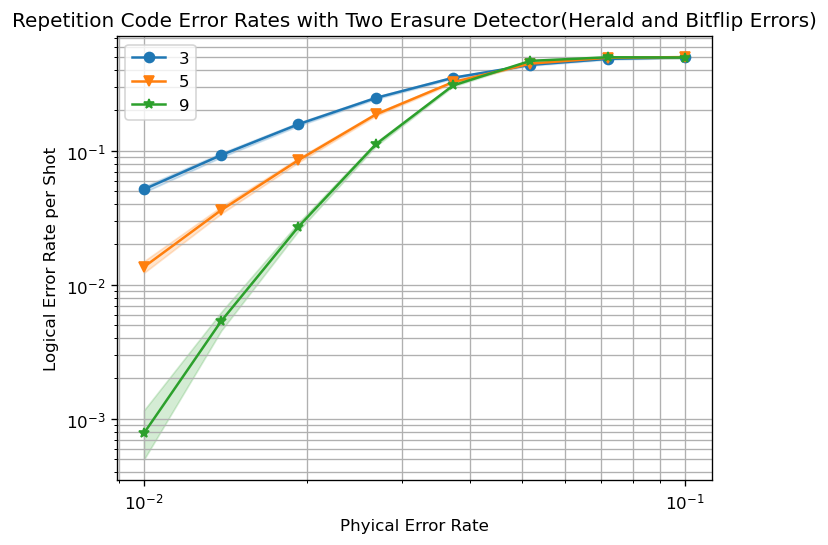

In [11]:
err_list_size = 8
d_list_size = 3

err_list = np.logspace(-2,-1,8)
d_list = [3, 5, 9]

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem_2(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem_2(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(5)),
        max_errors=int(10**(5)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1


# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates with Two Erasure Detector(Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


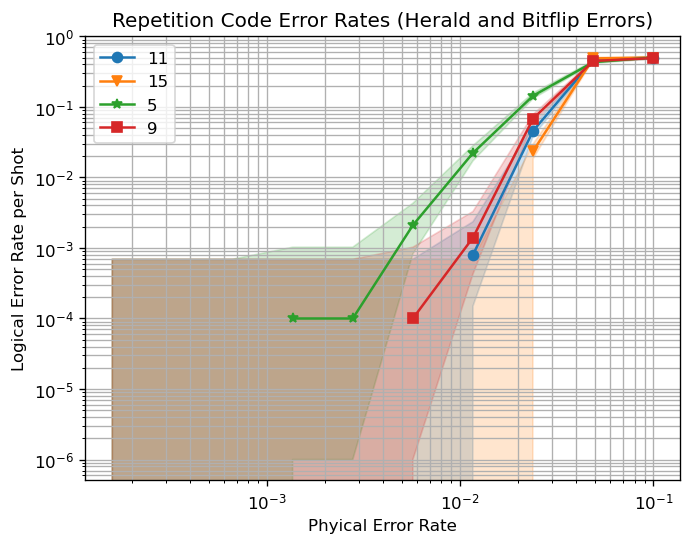

In [23]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-3.8,-1, err_list_size)
d_list = [5, 9, 11, 15]

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem_2(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem_2(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1

two_det_stats_2 = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


In [ ]:
err_list_size = 8
d_list_size = 3

err_list = np.logspace((8 * 10**(-2)), (4 * 10**(-2)), 8, base=1)
d_list = [3, 5, 9]

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem_2(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem_2(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1

two_det_stats_2 = collected_stats
# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


## Three Heralded erasure detectors


In [29]:
def three_det_get_circuit_and_dem(rounds, distance, bit_flip_rate_per_round, heralded_erasure_err, misassign_err):

    # initialize circuit info
    meas_len = distance - 1
    all_len = ((2 * distance) - 1)
    erase_len = all_len
    
    qubits = list(range(all_len))
    meas_qubits = list(qubits [1::2])
    data_qubits = list(qubits[0::2])

    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c_i = c_i + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)

    ### CNOTS
    c_i. append_operation ("CNOT", cnot1)
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c_i = c_i + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    c_i. append_operation ("CNOT", cnot2)

    # HERALD DET
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i = c_i + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    
    # BITFLIP DET
    c_i. append_operation ("MR", meas_qubits, misassign_err)
    coord = distance
    for m in range(meas_len, 0, -1):
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(m))], (coord, 0))
        coord -= 2
    
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c_i = c_i + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
        

    c = stim.Circuit ()
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    
    # BITFLIP DET
    c. append_operation ("MR", meas_qubits, misassign_err)
    sup = 4*erase_len + meas_len
    coord = distance
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + sup)) ], (coord, 0))
        coord -= 2
    
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    
    c *= rounds

    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + get_herald_subcircuit(qubits, erase_len, heralded_erasure_err)

    # BITFLIP DET
    c. append_operation ("MR", data_qubits, misassign_err)
    sup = 4*erase_len + meas_len
    coord = distance
    ct = 0
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + 1)), 
                                          stim.target_rec(-(m + sup + 1)) ], (coord, 1))
        coord -= 2
        ct += 1

    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c

    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    c = mwpf.heralded_dem.add_herald_detectors(c)


    return {'circuit': c, 'dem': dem}

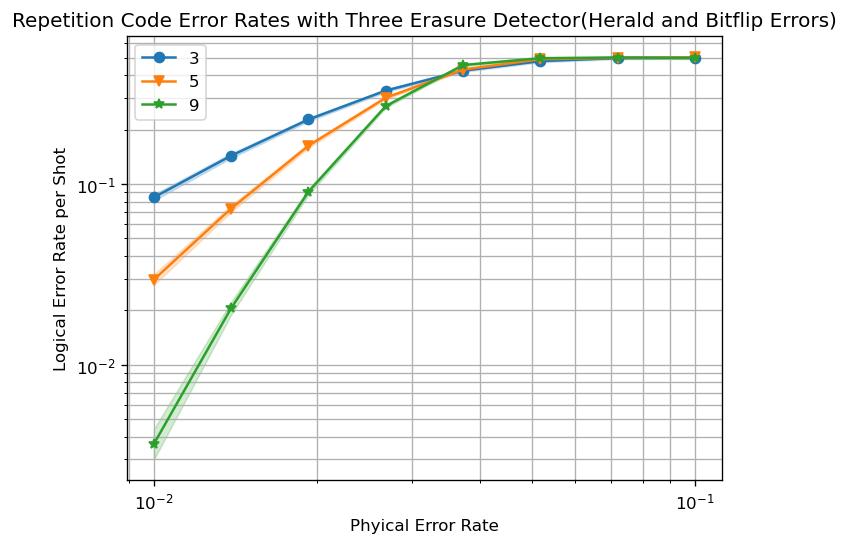

In [10]:
err_list_size = 8
d_list_size = 3

err_list = np.logspace(-2,-1,8)
d_list = [3, 5, 9]

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=three_det_get_circuit_and_dem(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(three_det_get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(5)),
        max_errors=int(10**(5)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1


# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates with Three Erasure Detector(Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


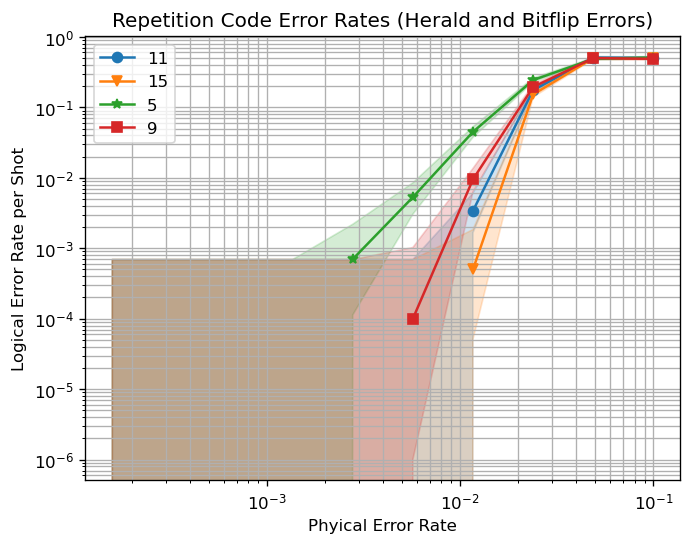

In [24]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-3.8,-1, err_list_size)
d_list = [5, 9, 11, 15]

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=three_det_get_circuit_and_dem(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(three_det_get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1

three_det_stats = collected_stats
# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


In [ ]:
err_list_size = 8
d_list_size = 3

err_list = np.logspace((9 * 10**(-2)), (5 * 10**(-2)), 8, base=1)
d_list = [3, 5, 9]

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=three_det_get_circuit_and_dem(d*3, d,  
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(three_det_get_circuit_and_dem(d*3, d, 
                                            (2/3)*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1

three_det_stats = collected_stats
# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


In [17]:
collected_stats

[]

In [16]:
plt.plot(collected_stats.json_metadata['p'])

AttributeError: 'list' object has no attribute 'json_metadata'

# Level 6--More errors and more accurate bitflip error rate. 

## One Herald

In [16]:
def one_det_get_circuit_and_dem(rounds, distance, bit_flip_rate_per_round, heralded_erasure_err, misassign_err, case = 1):

    # initialize circuit info
    meas_len = distance - 1
    all_len = ((2 * distance) - 1)
    erase_len = all_len
    if case == 1:
        erase_factor = 4
    elif case == 2:
        erase_factor = 5
    
    qubits = list(range(all_len))
    meas_qubits = list(qubits [1::2])
    data_qubits = list(qubits[0::2])
    erase_qubits_0 = list(range(0,all_len*3))
    erase_qubits = list(range(0,all_len*erase_factor))

    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    

    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    ### CNOTS
    c_i. append_operation ("CNOT", cnot1)
    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    c_i. append_operation ("CNOT", cnot2)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits_0, qubits, erase_len, heralded_erasure_err)
    if case == 2:   
        c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    # BITFLIP DET
    c_i. append_operation ("MR", meas_qubits, misassign_err)
    coord = distance
    for m in range(meas_len, 0, -1):
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(m))], (coord, 0))
        coord -= 2
        
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    c = stim.Circuit ()
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )  
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:   
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    # BITFLIP DET
    c. append_operation ("MR", meas_qubits, misassign_err)
    sup = erase_factor*erase_len + meas_len
    coord = distance
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + sup)) ], (coord, 0))
        coord -= 2
    
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)


    c *= rounds

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:   
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    # BITFLIP DET
    c. append_operation ("MR", data_qubits, misassign_err)
    sup = erase_factor*erase_len + meas_len
    coord = distance
    ct = 0
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + 1)), stim.target_rec(-(m + sup + 1)) ], (coord, 1))
        coord -= 2
        ct += 1

    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c

    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    c = mwpf.heralded_dem.add_herald_detectors(c)


    return {'circuit': c, 'dem': dem}

#### CASE 1: Constant erasure error (4)

In [15]:
print(np.__version__)

2.2.6


In [16]:
print(sinter.__version__)

1.15.0


In [9]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-3,-0.9,err_list_size)
d_list = [3, 5, 9, 11]

bitflip_factor = 1/10

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=one_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(one_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=10**(4),
        max_errors=10**(4),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1

one_det_stats = pd.Series(collected_stats)
one_det_stats.to_csv('one_det_stats.csv')

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


KeyboardInterrupt: 

##### threshold

In [7]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-1.7,-1.2,err_list_size)
d_list = [3, 5, 9, 11]

bitflip_factor = 1/10
x_factor = 1 + bitflip_factor

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=one_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(one_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list




collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "threshold_one_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

thresh_one_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: (x_factor)* stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

KeyboardInterrupt: 

In [ ]:
err_list_size = 12
d_list_size = 2

err_list = np.logspace(-1.7,-1.2,err_list_size)
d_list = [7,15]

bitflip_factor = 1/10

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=one_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(one_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list




collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=100).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "threshold_one_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

thresh_one_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: (x_factor)* stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

KeyboardInterrupt: 

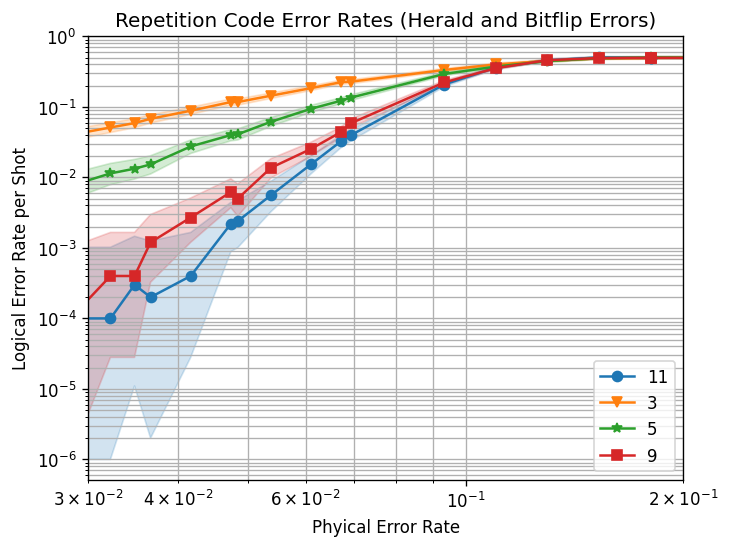

In [8]:
thresh_one_det_stats = sinter.stats_from_csv_files("threshold_one_det.csv")
# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=thresh_one_det_stats,
    x_func=lambda stats: (x_factor)* stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
ax.set_xlim(3e-2, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

[[Model]]
    Model(decay2)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 13
    # variables        = 3
    chi-square         = 0.01222488
    reduced chi-square = 0.00122249
    Akaike info crit   = -84.6000052
    Bayesian info crit = -82.9051571
    R-squared          = 0.98812050
[[Variables]]
    a:  0.00733593 +/- 0.00366099 (49.90%) (init = 0.1)
    b: -0.23347419 +/- 0.02508386 (10.74%) (init = 0)
    p:  0.03694484 +/- 0.01204989 (32.62%) (init = 0.04)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, p) = +0.9976
    C(a, b) = +0.8809
    C(b, p) = +0.8598
[[Model]]
    Model(decay2)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 13
    # variables        = 3
    chi-square         = 0.05335054
    reduced chi-square = 0.00533505
    Akaike info crit   = -65.4456668
    Bayesian info crit = -63.7508188
    R-squared          = 0.98258395
[[Variab

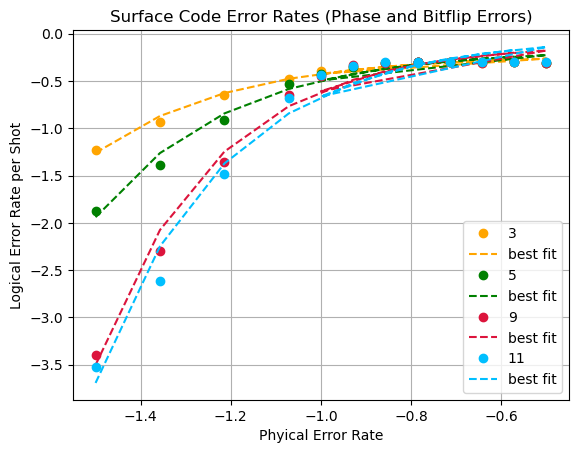

-0.039008166575850774

In [49]:
err_list_size = 8
d_list_size = 4

err_list = np.logspace(-1.5,-0.5,err_list_size)

a_list = np.logspace(-1,-4, err_list_size)
p_list = np.linspace(0.04,0.04, err_list_size)
guess_intervals = [(-1.1,-0.6), (-0.6, -0.4)]

log_find_exact_threshold(thresh_one_det_stats, 
                     err_list, 
                     err_list_size, 
                     d_list_size, 
                     False, 
                     a_list, 
                     p_list,
                     guess_intervals,
                     show_fit_report = True,
                     show_threshold_line=  False)

#### Case 2: erasure error after erasure checks

In [ ]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-2,-1,err_list_size)
d_list = [3, 5, 9, 11]

bitflip_factor = 1/10

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=one_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0,
                                            2)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(one_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0,
                                            2)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1

case2_one_det_stats = pd.Series(collected_stats)
case2_one_det_stats.to_csv('case2_one_det_stats.csv')

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

## Two Herald

### Between CNOTs and before measurement

In [46]:
def two_det_get_circuit_and_dem(rounds, distance, bit_flip_rate_per_round, heralded_erasure_err, misassign_err, case = 1):

    # initialize circuit info
    meas_len = distance - 1
    all_len = ((2 * distance) - 1)
    erase_len = all_len
    if case == 1:
        erase_factor = 4
    elif case == 2:
        erase_factor = 6
    
    qubits = list(range(all_len))
    meas_qubits = list(qubits [1::2])
    data_qubits = list(qubits[0::2])
    erase_qubits_0 = list(range(0,all_len*2))
    if case == 1:
        erase_qubits_1 = list(range(0,all_len*2))
        erase_qubits_2 = qubits
    elif case == 2:
        erase_qubits_1 = list(range(0,all_len*3))
        erase_qubits_2 = list(range(0,all_len*2))


    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    ### CNOTS
    c_i. append_operation ("CNOT", cnot1)
    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits_0, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    c_i. append_operation ("CNOT", cnot2)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits_2, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    # BITFLIP DET
    c_i. append_operation ("MR", meas_qubits, misassign_err)
    coord = distance
    for m in range(meas_len, 0, -1):
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(m))], (coord, 0))
        coord -= 2
        
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)


    c = stim.Circuit ()
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits_1, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )  
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits_2, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    # BITFLIP DET
    c. append_operation ("MR", meas_qubits, misassign_err)
    sup = erase_factor*erase_len + meas_len
    coord = distance
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + sup)) ], (coord, 0))
        coord -= 2
    
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    c *= rounds

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits_1, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits_2, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    # BITFLIP DET
    c. append_operation ("MR", data_qubits, misassign_err)
    sup = erase_factor*erase_len + meas_len
    coord = distance
    ct = 0
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + 1)), stim.target_rec(-(m + sup + 1)) ], (coord, 1))
        coord -= 2
        ct += 1

    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c

    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    c = mwpf.heralded_dem.add_herald_detectors(c)


    return {'circuit': c, 'dem': dem}

#### CASE 1: Constant erasure error (4)

In [10]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-4,-1,err_list_size)
d_list = [3, 5, 9, 11]

bitflip_factor = 1/10

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_taskstat: List[sinter.TaskStats]= sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_taskstat
    t+=1

for i in range(d_list_size*err_list_size):
    collected_stats[i].to_csv_line("threshold_two_det.csv")
    
two_det_stats = collected_stats
# two_det_stats.to_csv('two_det_stats.csv')

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


NameError: name 'two_det_get_circuit_and_dem' is not defined

##### threshold

In [19]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-1.7,-1.2,err_list_size)
d_list = [3, 5, 9, 11]

bitflip_factor = 1/10

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list


collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "threshold_two_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

# for i in range(d_list_size*err_list_size):
#     collected_stats[i].to_csv_line("threshold_two_det.csv")
    
# two_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

NameError: name 'two_det_get_circuit_and_dem' is not defined

Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       9983        9991 p=0.1,d=3    
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       8908        9520 p=0.1,d=3    
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       7884        9088 p=0.1,d=3    
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       4812        7832 p=0.1,d=3    
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       3788        7412 p=0.1,d=3    
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf   ?          0        5868 p=0.1,d=3    
Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       9983        9991 p=0.1,d=5    
1 tasks left:
  workers decoder 

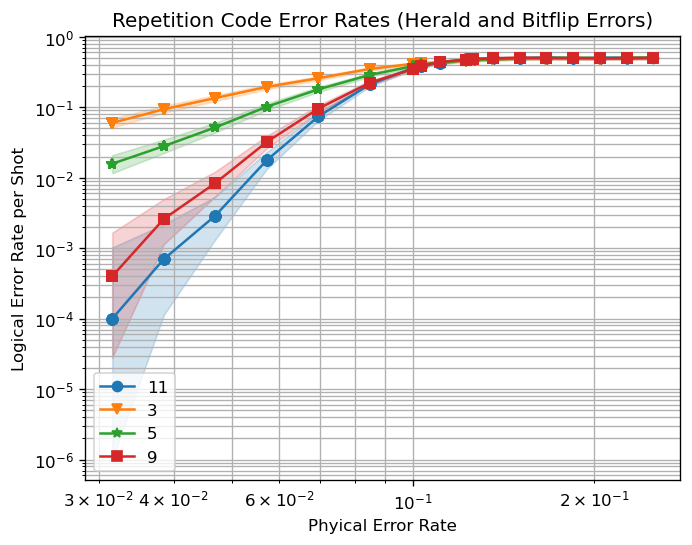

In [85]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-1,-0.6,err_list_size)
d_list = [3, 5, 9, 11]

bitflip_factor = 1/10

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list


collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "threshold_two_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

# for i in range(d_list_size*err_list_size):
#     collected_stats[i].to_csv_line("threshold_two_det.csv")
    
# two_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

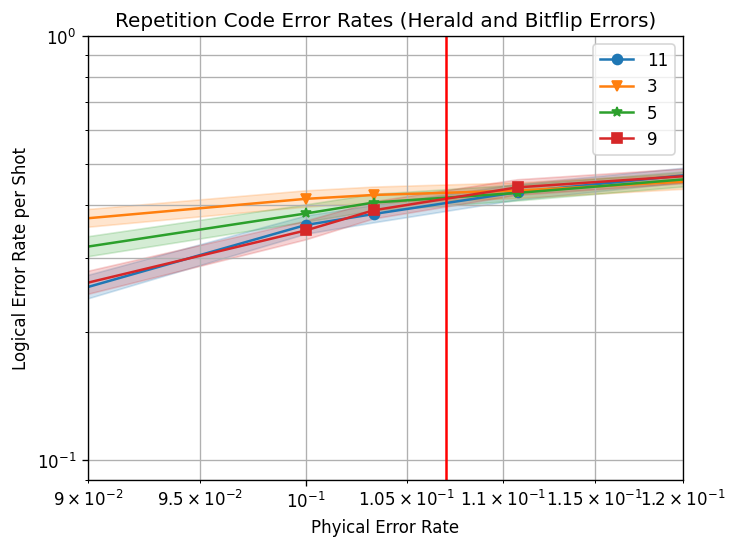

In [40]:
thresh_two_det_stats = sinter.stats_from_csv_files("threshold_two_det.csv")
# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=thresh_two_det_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
ax.set_ylim(9e-2, 1)
ax.set_xlim(9e-2, 1.2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()

plt.vlines(1.07e-1, 1e-2, 1, "red")
fig.set_dpi(120) 

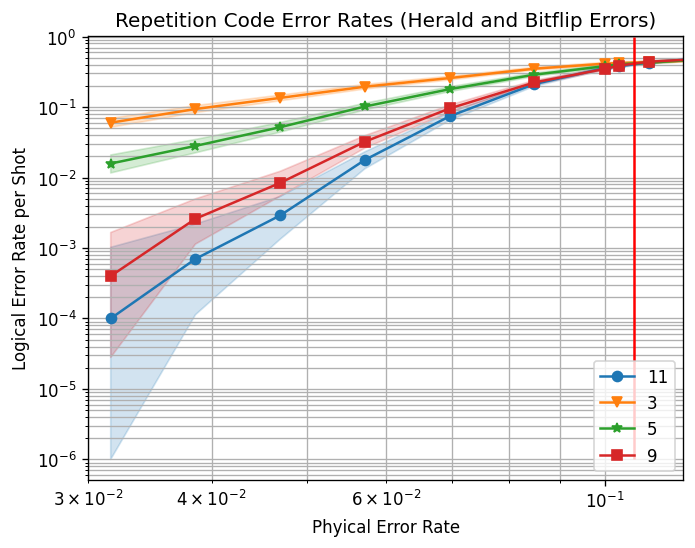

In [53]:
thresh_two_det_stats = sinter.stats_from_csv_files("threshold_two_det.csv")
# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=thresh_two_det_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(9e-2, 1)
ax.set_xlim(3e-2, 1.2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()

plt.vlines(1.07e-1, 1e-6, 1, "red")
fig.set_dpi(120) 

In [ ]:
find_exact_threshold(two_det_stats, 
                     err_list, 
                     err_list_size, 
                     d_list_size, 
                     False, 
                     a_list, 
                     p_list)

### Before and after CNOTs

In [47]:
def two_det_get_circuit_and_dem_2(rounds, distance, bit_flip_rate_per_round, heralded_erasure_err, misassign_err, case = 1):

    # initialize circuit info
    meas_len = distance - 1
    all_len = ((2 * distance) - 1)
    erase_len = all_len
    if case == 1:
        erase_factor = 4
    elif case == 2:
        erase_factor = 6
    
    qubits = list(range(all_len))
    meas_qubits = list(qubits [1::2])
    data_qubits = list(qubits[0::2])
    erase_qubits_0 = qubits
    erase_qubits_1 = list(range(0,all_len*2))
    if case == 1:
        erase_qubits_2 = list(range(0,all_len*2))
    elif case == 2:
        erase_qubits_2 = list(range(0,all_len*3))


    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits_0, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
        

    ### CNOTS
    c_i. append_operation ("CNOT", cnot1)
    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    c_i. append_operation ("CNOT", cnot2)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits_2, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    # BITFLIP DET
    c_i. append_operation ("MR", meas_qubits, misassign_err)
    coord = distance
    for m in range(meas_len, 0, -1):
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(m))], (coord, 0))
        coord -= 2
        
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)


    c = stim.Circuit ()
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits_1, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )  
    # HERALD + DET
    c = c +  one_time_get_herald_subcircuit(erase_qubits_2, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)


    # BITFLIP DET
    c. append_operation ("MR", meas_qubits, misassign_err)
    sup = 4*erase_len + meas_len
    coord = distance
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + sup)) ], (coord, 0))
        coord -= 2
    
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    c *= rounds

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits_1, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)


    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c +  one_time_get_herald_subcircuit(erase_qubits_2, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)


    # BITFLIP DET
    c. append_operation ("MR", data_qubits, misassign_err)
    sup = 4*erase_len + meas_len
    coord = distance
    ct = 0
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + 1)), stim.target_rec(-(m + sup + 1)) ], (coord, 1))
        coord -= 2
        ct += 1

    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c

    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    c = mwpf.heralded_dem.add_herald_detectors(c)


    return {'circuit': c, 'dem': dem}

#### CASE 1: Constant erasure error (4)

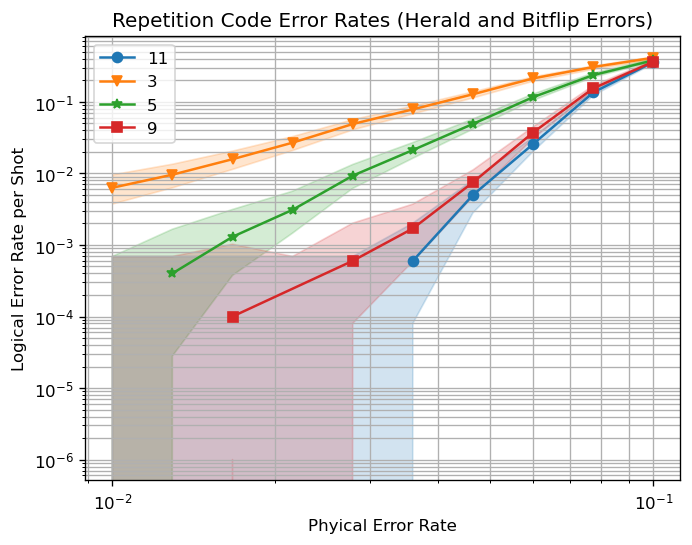

In [ ]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-2,-0.6,err_list_size)
d_list = [3, 5, 9, 11]

bitflip_factor = 1/10

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem_2(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem_2(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1

two_det_stats_2 = pd.Series(collected_stats)
two_det_stats_2.to_csv('two_det_stats_2.csv')

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


##### threshold

Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata           
        4    mwpf <1m       9999       10000 p=0.0199526231496888,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata           
        4    mwpf <1m       3609        9855 p=0.0199526231496888,d=3
0 tasks left:

Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata           
        4    mwpf <1m       9727        9999 p=0.0199526231496888,d=5
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata           
        4    mwpf <1m       9454        9999 p=0.0199526231496888,d=5
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata           
        4    mwpf <1m       7884        9996 p=0.0199526231496888,d=5
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata           
        4    mwpf <1m       5836        9989 p=0.0199526231496888,d=5
1 tasks left:
  w

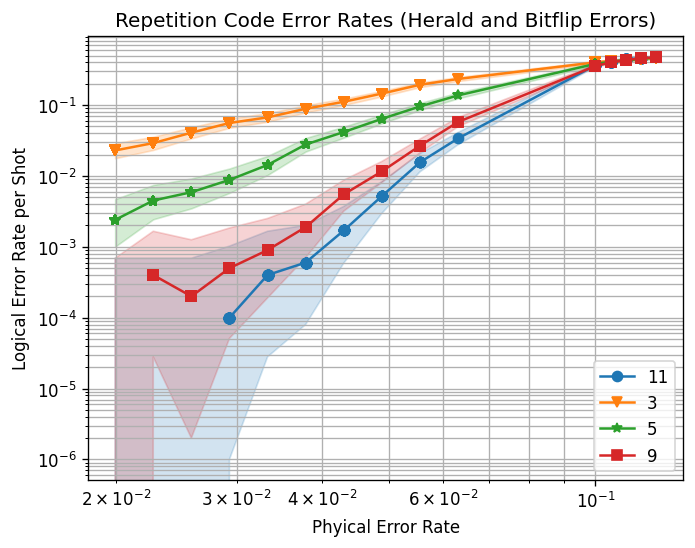

In [25]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-1.7,-1.2,err_list_size)
d_list = [3, 5, 9, 11]

bitflip_factor = 1/10

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem_2(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem_2(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "threshold_two_det_2.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1



# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9999        9999 p=0.07943282347242814,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       8908        9644 p=0.07943282347242814,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       4812        8368 p=0.07943282347242814,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf   ?          0        6848 p=0.07943282347242814,d=3
Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9983        9993 p=0.07943282347242814,d=5
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
   

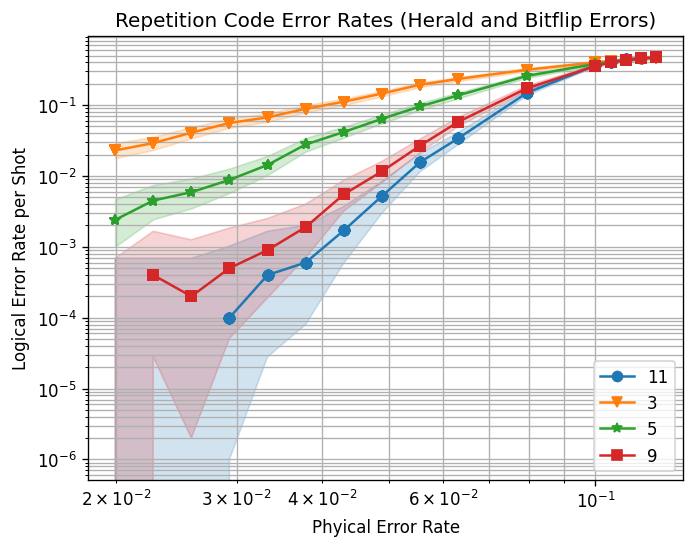

In [27]:
err_list_size = 3
d_list_size = 4

err_list = np.logspace(-1.2,-1,err_list_size)
d_list = [3, 5, 9, 11]

bitflip_factor = 1/10

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem_2(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem_2(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "threshold_two_det_2.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1



# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


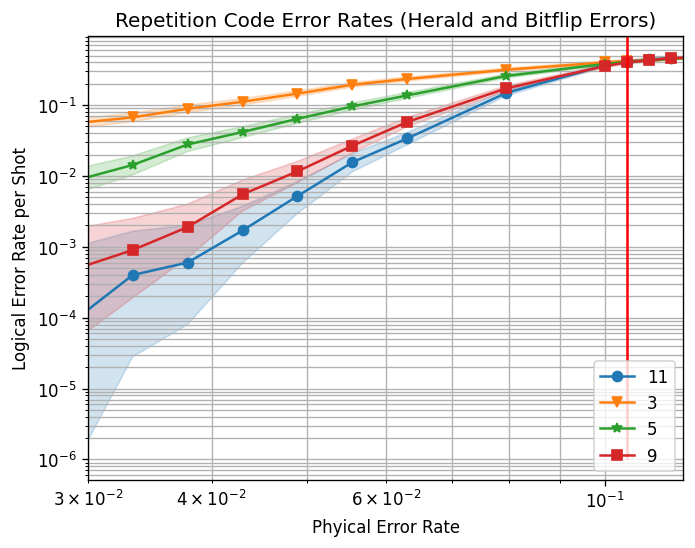

In [48]:
thresh_two_det_stats_2 = sinter.stats_from_csv_files("threshold_two_det_2.csv")
# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=thresh_two_det_stats_2,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(9e-2, 1)
ax.set_xlim(3e-2, 1.2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()

plt.vlines(1.053e-1, 1e-6, 1, "red")
fig.set_dpi(120) 

## Three Herald

In [48]:
def three_det_get_circuit_and_dem(rounds, distance, bit_flip_rate_per_round, heralded_erasure_err, misassign_err, case = 1):

    # initialize circuit info
    meas_len = distance - 1
    all_len = ((2 * distance) - 1)
    erase_len = all_len

    if case == 1:
        erase_factor = 4
    elif case == 2:
        erase_factor = 6
    
    qubits = list(range(all_len))
    meas_qubits = list(qubits [1::2])
    data_qubits = list(qubits[0::2])

    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]

    if case == 1:
        erase_qubits = qubits
    elif case == 2:
        erase_qubits = list(range(0,all_len*2))
 

    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    ### CNOTS
    c_i. append_operation ("CNOT", cnot1)
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c_i. append_operation ("CNOT", cnot2)

    # HERALD DET
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    # BITFLIP DET
    c_i. append_operation ("MR", meas_qubits, misassign_err)
    coord = distance
    for m in range(meas_len, 0, -1):
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(m))], (coord, 0))
        coord -= 2
    
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
        

    c = stim.Circuit ()
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    # BITFLIP DET
    c. append_operation ("MR", meas_qubits, misassign_err)
    sup = 4*erase_len + meas_len
    coord = distance
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + sup)) ], (coord, 0))
        coord -= 2
    
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    c *= rounds

    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD DET
    c = c + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    # BITFLIP DET
    c. append_operation ("MR", data_qubits, misassign_err)
    sup = 4*erase_len + meas_len
    coord = distance
    ct = 0
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + 1)), 
                                          stim.target_rec(-(m + sup + 1)) ], (coord, 1))
        coord -= 2
        ct += 1

    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c

    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    c = mwpf.heralded_dem.add_herald_detectors(c)


    return {'circuit': c, 'dem': dem}

#### CASE 1: Constant erasure error (4)

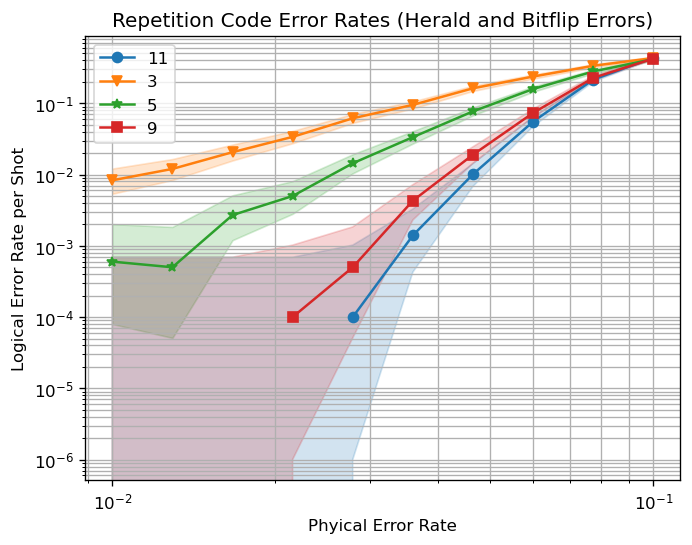

In [7]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-2,-1,err_list_size)
d_list = [3, 5, 9, 11]

bitflip_factor = 1/10

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=three_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(three_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size
        )
    collected_stats = collected_stats + collected_stat 
    t+=1

three_det_stats = pd.Series(collected_stats)
three_det_stats.to_csv('three_det_stats.csv')

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


##### threshold

Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9999       10000 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       8908        9804 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       4812        9017 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       1203        8370 p=0.05011872336272722,d=3
0 tasks left:

Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9999       10000 p=0.05011872336272722,d=5
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9982        9999 p=0.05011872336272722,d=5
1 tas

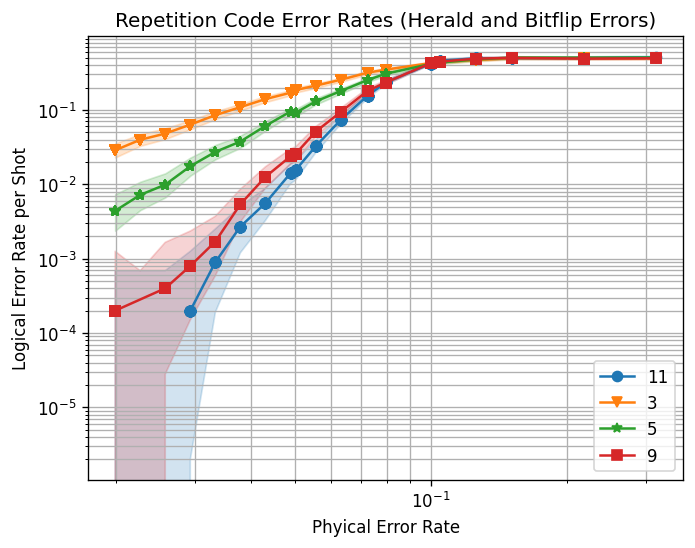

In [18]:
err_list_size = 6
d_list_size = 4
d_list = [3,5,9,11]

err_list = np.logspace(-1.3,-0.5,err_list_size)
bitflip_factor = 1/10


def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=three_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(three_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "threshold_three_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1



# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata           
        4    mwpf <1m       9727        9997 p=0.0199526231496888,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata           
        4    mwpf <1m       4812        9833 p=0.0199526231496888,d=3
0 tasks left:

Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata           
        4    mwpf <1m       9727        9999 p=0.0199526231496888,d=5
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata           
        4    mwpf <1m       9710        9999 p=0.0199526231496888,d=5
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata           
        4    mwpf <1m       9164        9997 p=0.0199526231496888,d=5
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata           
        4    mwpf <1m       7884        9996 p=0.0199526231496888,d=5
1 tasks left:
  w

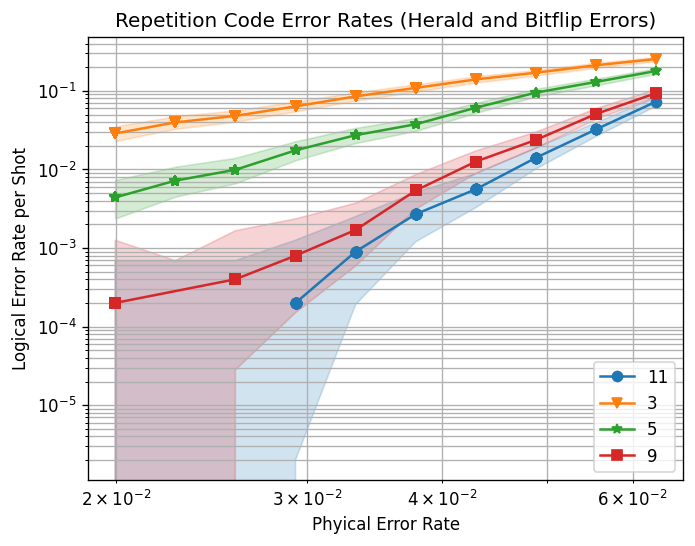

In [23]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-1.7,-1.2,err_list_size)

bitflip_factor = 1/10


def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=three_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(three_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "threshold_three_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1



# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


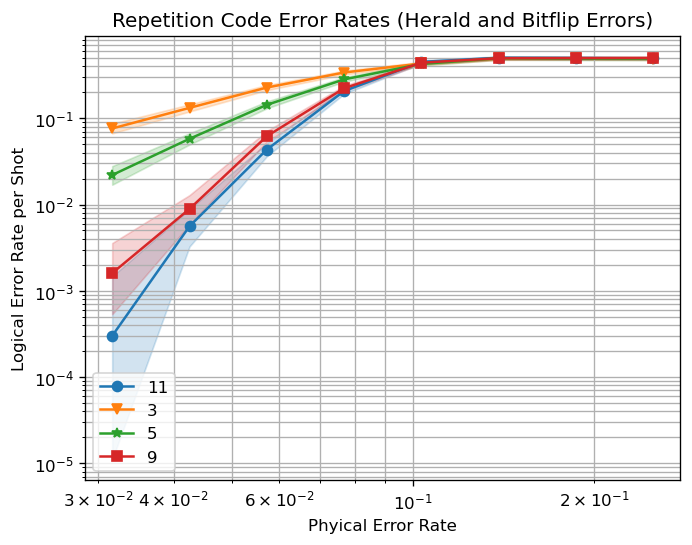

In [ ]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-1,-0.8,err_list_size)
d_list = [3, 5, 9, 11]

bitflip_factor = 1/10

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=three_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(three_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list



collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = generate_circuits()[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "threshold_three_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1



# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 


# lambda of 2 det

In [16]:
err_list_size = 10
d_list_size = 4

#err_list = np.logspace(-1.7,-1.2,err_list_size)
d_list = [3, 5]
bitflip_factor = 1/10
rep_list = list(range(120,200, 10))

def generate_example_tasks():
    p = (10/11)*(1e-2)
    for r in rep_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem(r, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                    'r': r
                },
            )

def generate_circuits():
    circ_list = []
    p = (10/11)*(1e-2)
    for r in rep_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem(r, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list


collected_stats = list()
t = 0
circ_list = generate_circuits()
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "lambda_rep_two_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

# for i in range(d_list_size*err_list_size):
#     collected_stats[i].to_csv_line("threshold_two_det.csv")
    
# two_det_stats = collected_stats

# Render a matplotlib plot of the data.
# fig, ax = plt.subplots(1, 1)
# sinter.plot_error_rate(
#     ax=ax,
#     stats=collected_stats,
#     x_func=lambda stats: stats.json_metadata['p'],
#     group_func=lambda stats: stats.json_metadata['d'],
# )
# # ax.set_ylim(5e-6, 1e-1)
# # ax.set_xlim(5e-6, 2e-1)
# ax.loglog()
# ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
# ax.set_xlabel("Phyical Error Rate")
# ax.set_ylabel("Logical Error Rate per Shot")
# ax.grid(which='major')
# ax.grid(which='minor')
# ax.legend()
# fig.set_dpi(120) 

Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata                  
        4    mwpf <1m       9999       10000 p=0.00909090909090909,d=3,r=120
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata                  
        4    mwpf <1m       9727        9986 p=0.00909090909090909,d=3,r=120
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata                  
        4    mwpf <1m       8703        9943 p=0.00909090909090909,d=3,r=120
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata                  
        4    mwpf <1m       7679        9902 p=0.00909090909090909,d=3,r=120
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata                  
        4    mwpf <1m       7500        9898 p=0.00909090909090909,d=3,r=120
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata                  
        4    mwpf <1m       7483        9898 p=

RuntimeError: Worker failed: traceback=Traceback (most recent call last):
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\sinter\_collection\_collection_worker_state.py", line 243, in run_message_loop
    num_messages_processed = self.process_messages()
                             ^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\sinter\_collection\_collection_worker_state.py", line 182, in process_messages
    self.change_job(new_task=new_task, new_collection_options=new_collection_options)
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\sinter\_collection\_collection_worker_state.py", line 145, in change_job
    self.compiled_sampler = self.sampler.compiled_sampler_for_task(self.current_task)
                            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\sinter\_collection\_sampler_ramp_throttled.py", line 27, in compiled_sampler_for_task
    compiled_sub_sampler = self.sub_sampler.compiled_sampler_for_task(task)
                           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\sinter\_collection\_mux_sampler.py", line 30, in compiled_sampler_for_task
    return self._resolve_sampler(task.decoder).compiled_sampler_for_task(task)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\sinter\_decoding\_stim_then_decode_sampler.py", line 40, in compiled_sampler_for_task
    return _CompiledStimThenDecodeSampler(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\sinter\_decoding\_stim_then_decode_sampler.py", line 161, in __init__
    self.compiled_decoder = _compile_decoder_with_disk_fallback(decoder, task, tmp_dir)
                            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\sinter\_decoding\_stim_then_decode_sampler.py", line 142, in _compile_decoder_with_disk_fallback
    return decoder.compile_decoder_for_dem(dem=task.detector_error_model)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\mwpf\sinter_decoders.py", line 180, in compile_decoder_for_dem
    solver, predictor, bp_decoder = self.common_prepare(dem)
                                    ^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\mwpf\sinter_decoders.py", line 130, in common_prepare
    solver, predictor = construct_decoder_and_predictor(
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\mwpf\sinter_decoders.py", line 290, in construct_decoder_and_predictor
    initializer = heralded_dem.initializer
                  ^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\functools.py", line 998, in __get__
    val = self.func(instance)
          ^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\mwpf\heralded_dem.py", line 305, in initializer
    for dic in self.herald_fault_map
               ^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\functools.py", line 998, in __get__
    val = self.func(instance)
          ^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\mwpf\heralded_dem.py", line 276, in herald_fault_map
    if detector not in self.heralded_dems:
                       ^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\functools.py", line 998, in __get__
    val = self.func(instance)
          ^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\mwpf\heralded_dem.py", line 209, in heralded_dems
    circuit_no_noise = self.ref_circuit.remove_noise_channels(
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\diyan\anaconda3\envs\simulation\Lib\site-packages\mwpf\ref_circuit.py", line 451, in remove_noise_channels
    assert len(set(deleting_indices)) == len(deleting_indices), "bug: duplicate"
               ^^^^^^^^^^^^^^^^^^^^^
MemoryError


In [ ]:
err_list_size = 10
d_list_size = 4

#err_list = np.logspace(-1.7,-1.2,err_list_size)
d_list = [3, 5]
bitflip_factor = 1/10
rep_list = list(range(50,120, 8))

def generate_example_tasks():
    p = (10/11)*(1e-2)
    for r in rep_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem(r, d,  
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                    'r': r
                },
            )

def generate_circuits():
    circ_list = []
    p = (10/11)*(1e-2)
    for r in rep_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem(r, d, 
                                            bitflip_factor*p, 
                                            p, 
                                            0)['circuit'])
    return circ_list


collected_stats = list()
t = 0
circ_list = generate_circuits()
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "lambda_rep_two_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

# for i in range(d_list_size*err_list_size):
#     collected_stats[i].to_csv_line("threshold_two_det.csv")
    
# two_det_stats = collected_stats

# Render a matplotlib plot of the data.
# fig, ax = plt.subplots(1, 1)
# sinter.plot_error_rate(
#     ax=ax,
#     stats=collected_stats,
#     x_func=lambda stats: stats.json_metadata['p'],
#     group_func=lambda stats: stats.json_metadata['d'],
# )
# # ax.set_ylim(5e-6, 1e-1)
# # ax.set_xlim(5e-6, 2e-1)
# ax.loglog()
# ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
# ax.set_xlabel("Phyical Error Rate")
# ax.set_ylabel("Logical Error Rate per Shot")
# ax.grid(which='major')
# ax.grid(which='minor')
# ax.legend()
# fig.set_dpi(120) 

Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata                 
        4    mwpf <1m       9999       10000 p=0.00909090909090909,d=3,r=50
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata                 
        4    mwpf <1m       9181        9985 p=0.00909090909090909,d=3,r=50
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata                 
        4    mwpf <1m       8157        9965 p=0.00909090909090909,d=3,r=50
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata                 
        4    mwpf <1m       6109        9931 p=0.00909090909090909,d=3,r=50
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata                 
        4    mwpf <1m       2858        9887 p=0.00909090909090909,d=3,r=50
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata                 
        4    mwpf <1m       2477        9884 p=0.009090909

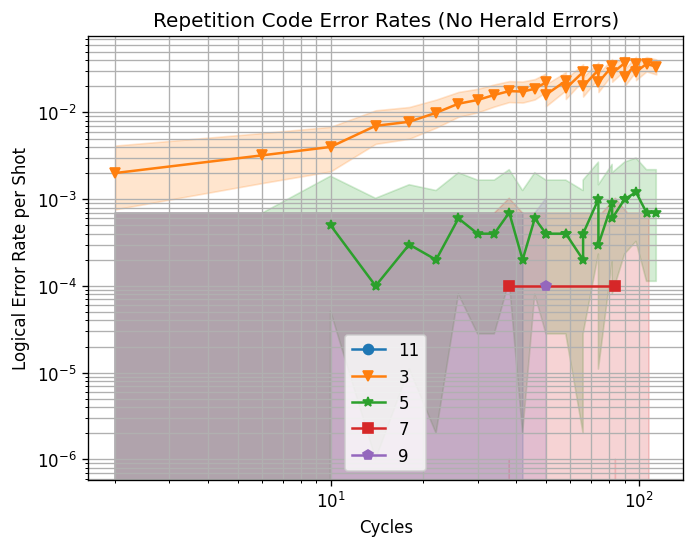

In [22]:
lambda_rep_two_det = sinter.stats_from_csv_files("lambda_rep_two_det.csv")


# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=lambda_rep_two_det ,
    x_func=lambda stats: stats.json_metadata['r'],
    group_func=lambda stats: stats.json_metadata['d'],
)


ax.loglog()
ax.set_title("Repetition Code Error Rates (No Herald Errors)")
ax.set_xlabel("Cycles")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
# plt.vlines(2.65e-2, 1e-3, 1, "red")
ax.legend()
fig.set_dpi(120) 

# 7/10 erasure fraction repetition code

## One herald

Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata              
        4    mwpf  2m       9999       10000 p=0.015058363542798407,d=11
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata              
        4    mwpf <1m       9991       10000 p=0.015058363542798407,d=11
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata              
        4    mwpf <1m       9863       10000 p=0.015058363542798407,d=11
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata              
        4    mwpf <1m       9735       10000 p=0.015058363542798407,d=11
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata              
        4

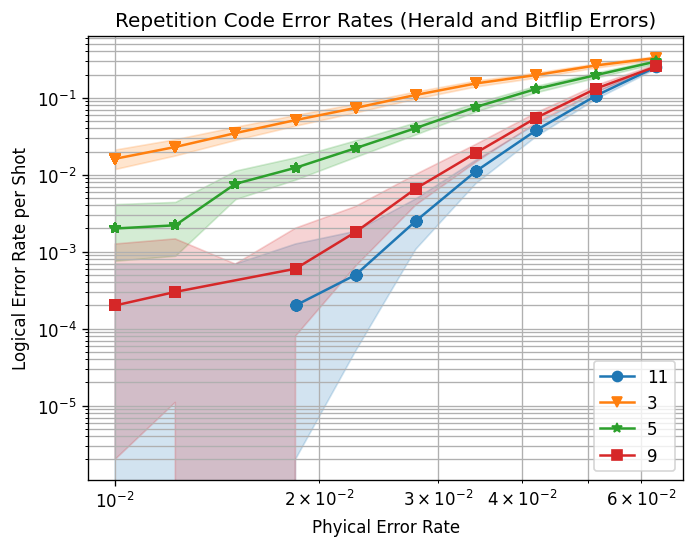

In [19]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-2,-1.2,err_list_size)
d_list = [3, 5, 9, 11]

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=one_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(one_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list



circ_list = generate_circuits()
collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "seventy_percent_one_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

thresh_one_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9999        9999 p=0.07943282347242814,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9437        9786 p=0.07943282347242814,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       8908        9579 p=0.07943282347242814,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       7884        9196 p=0.07943282347242814,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       4812        8022 p=0.07943282347242814,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       3788        7632 p=0.07943282347242814,d=3
1 tasks left:
  workers decoder eta shots_

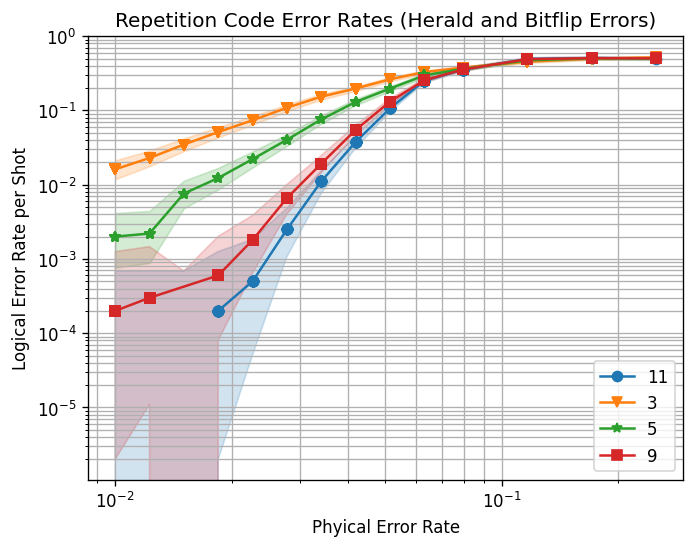

In [16]:
err_list_size = 4
d_list_size = 4

err_list = np.logspace(-1.1,-0.6,err_list_size)
d_list = [3, 5, 9, 11]

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=one_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(one_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list



circ_list = generate_circuits()
collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "seventy_percent_one_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

thresh_one_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

### threshold

Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf  2m       9999       10000 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9863        9966 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9590        9897 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9589        9897 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9044        9746 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       6996        9219 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_

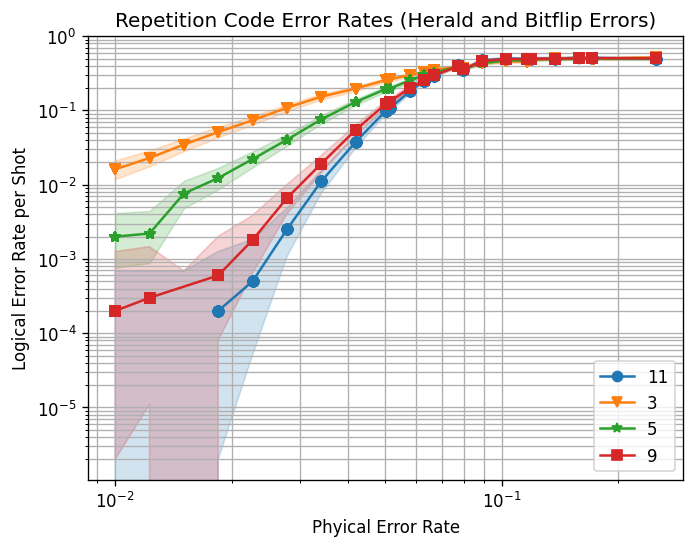

In [16]:
err_list_size = 9
d_list_size = 4

err_list = np.logspace(-1.3,-0.8,err_list_size)
d_list = [3, 5, 9, 11]

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=one_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(one_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list



circ_list = generate_circuits()
collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "seventy_percent_one_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

thresh_one_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

### threshold but on seperate plot

Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9999       10000 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9727        9924 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9709        9918 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       9181        9771 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       7884        9430 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        4    mwpf <1m       6860        9152 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_

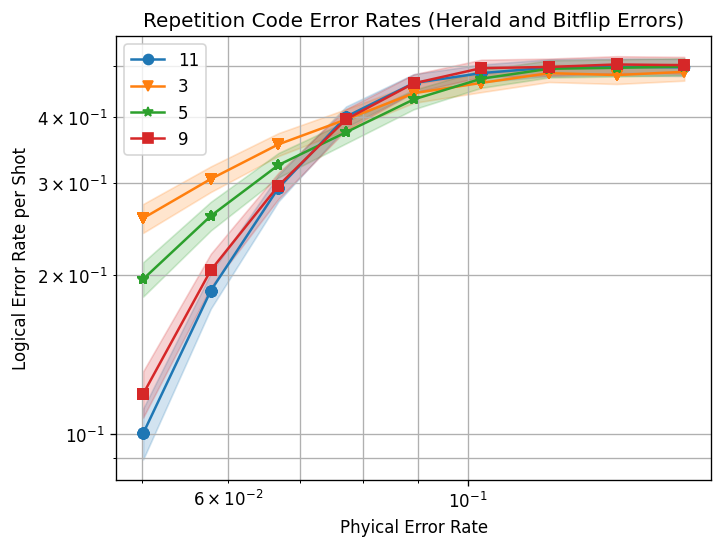

In [19]:
err_list_size = 9
d_list_size = 4

err_list = np.logspace(-1.3,-0.8,err_list_size)
d_list = [3, 5, 9, 11]

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=one_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(one_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list



circ_list = generate_circuits()
collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=6,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "thresh_seventy_percent_one_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

thresh_one_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

## Two herald

### between CNOTs and before measurement

Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       9999       10000 p=0.01,d=3   
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       6860        9961 p=0.01,d=3   
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf   ?          0        9863 p=0.01,d=3   
Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       9727       10000 p=0.01,d=5   
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       6860        9991 p=0.01,d=5   
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       1382        9979 p=0.01,d=5   
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf   ?          0        9978 p=0.01,d=5   
Starting 4 workers...
1 tasks le

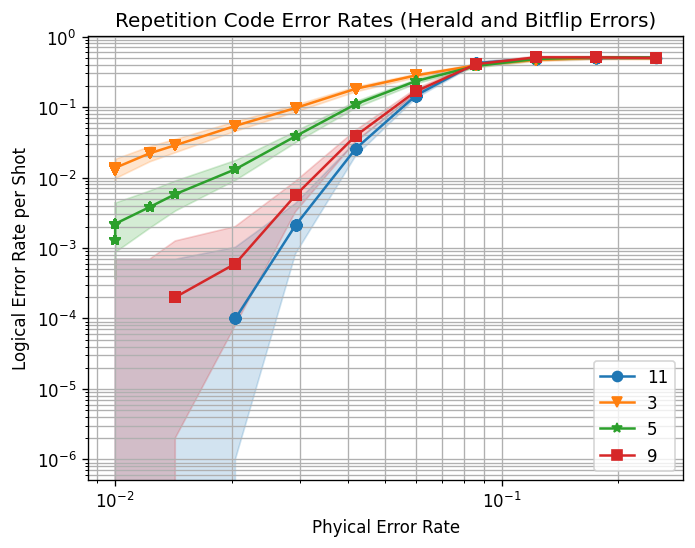

In [17]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-2,-0.6,err_list_size)
d_list = [3, 5, 9, 11]

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list




circ_list = generate_circuits()
collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "seventy_percent_two_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

thresh_one_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

#### threshold

In [ ]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-1.3,-0.8,err_list_size)
d_list = [3, 5, 9, 11]

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list




circ_list = generate_circuits()
collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=6,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "seventy_percent_two_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

thresh_one_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

Starting 6 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       9999       10000 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       9983        9996 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       9727        9925 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       9147        9794 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       8891        9734 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       7338        9353 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_

#### threshold but on own plot

Starting 6 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       9999       10000 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       9998       10000 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       9181        9780 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       8635        9655 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       5563        8906 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       5193        8804 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_

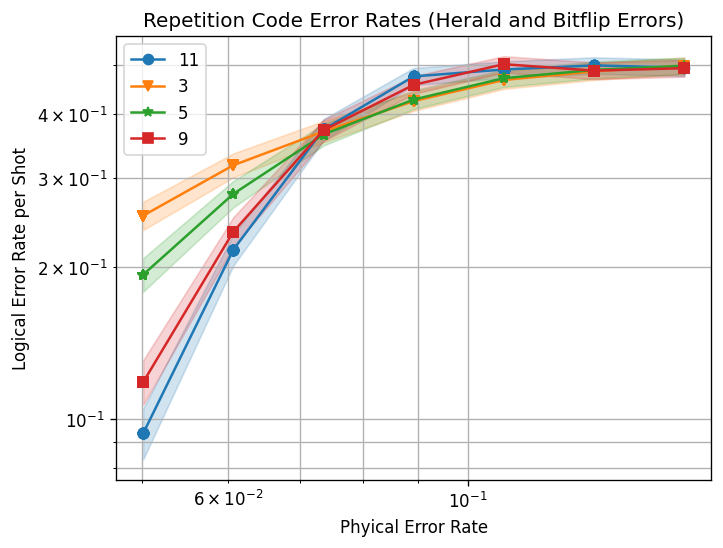

In [20]:
err_list_size = 7
d_list_size = 4

err_list = np.logspace(-1.3,-0.8,err_list_size)
d_list = [3, 5, 9, 11]

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list




circ_list = generate_circuits()
collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=6,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "thresh_seventy_percent_two_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

thresh_one_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

### before CNOT and before measurement

Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata             
        4    mwpf  3m       7925        8979 p=0.17556762912750015,d=11
1 tasks left:
  workers decoder eta shots_left err

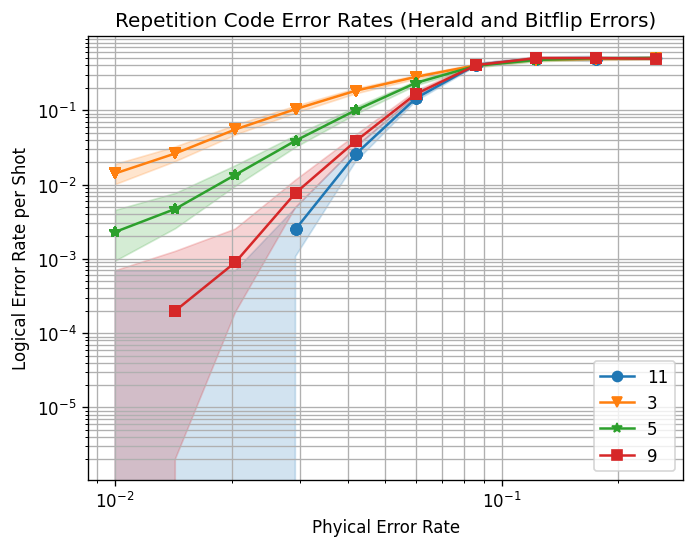

In [17]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-2,-0.6,err_list_size)
d_list = [3, 5, 9, 11]

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem_2(d*3, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem_2(d*3, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list




circ_list = generate_circuits()
collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "seventy_percent_two_det_2.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

thresh_one_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

#### threshold

Starting 6 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       9999        9999 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       9572        9880 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       9043        9741 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       8771        9665 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       7747        9380 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata            
        6    mwpf <1m       4675        8582 p=0.05011872336272722,d=3
1 tasks left:
  workers decoder eta shots_

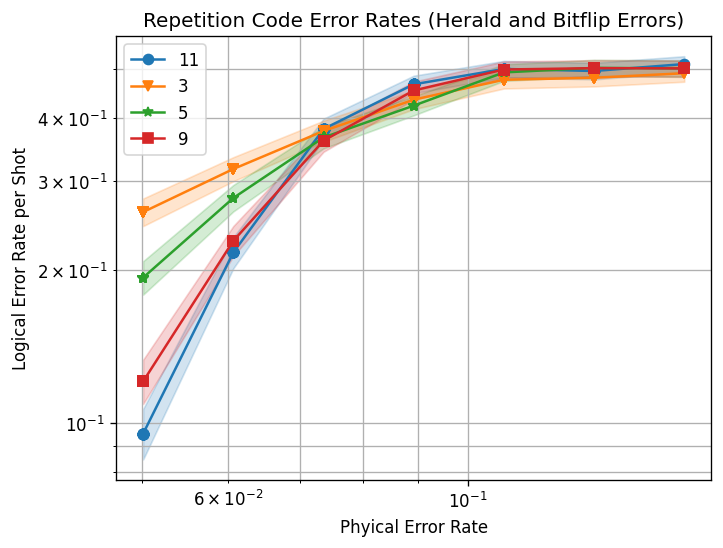

In [21]:
err_list_size = 7
d_list_size = 4

err_list = np.logspace(-1.3,-0.8,err_list_size)
d_list = [3, 5, 9, 11]

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem_2(d*3, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem_2(d*3, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list




circ_list = generate_circuits()
collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=6,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "thresh_seventy_percent_two_det_2.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

thresh_one_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

## Three herald

Starting 4 workers...
Starting 4 workers...
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       9727        9997 p=0.01,d=5   
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       8703        9994 p=0.01,d=5   
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       7679        9993 p=0.01,d=5   
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       7500        9992 p=0.01,d=5   
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       7499        9992 p=0.01,d=5   
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       7227        9990 p=0.01,d=5   
1 tasks left:
  workers decoder eta shots_left errors_left json_metadata
        4    mwpf <1m       6602        9985 p=0.01,d=5   
1 tasks left:
  workers decoder 

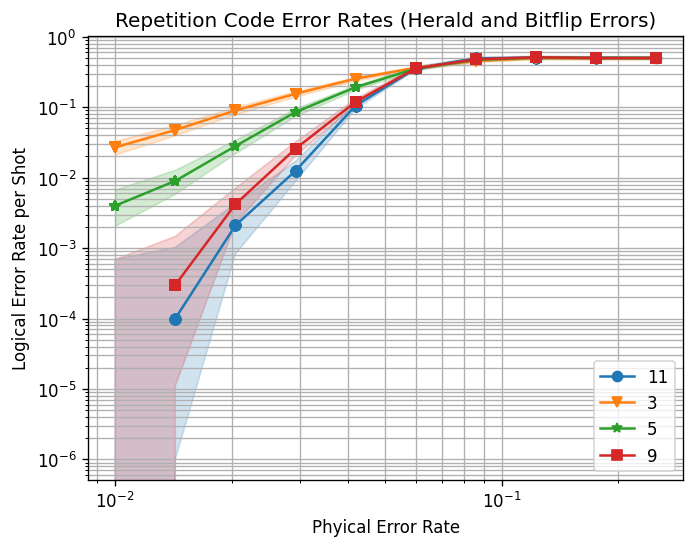

In [16]:
err_list_size = 10
d_list_size = 4

err_list = np.logspace(-2,-0.6,err_list_size)
d_list = [3, 5, 9, 11]

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=three_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(three_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list




circ_list = generate_circuits()
collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "seventy_percent_three_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

thresh_one_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

### threshold

In [ ]:
err_list_size = 7
d_list_size = 4

err_list = np.logspace(-1.3,-0.8,err_list_size)
d_list = [3, 5, 9, 11]

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    for p in err_list:
        for d in d_list:
            yield sinter.Task(
                circuit=three_det_get_circuit_and_dem(d*3, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                },
            )

def generate_circuits():
    circ_list = []
    for p in err_list:
        for d in d_list:
            circ_list.append(three_det_get_circuit_and_dem(d*3, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list




circ_list = generate_circuits()
collected_stats = list()
t = 0
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=6,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "thresh_seventy_percent_three_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1

thresh_one_det_stats = collected_stats

# Render a matplotlib plot of the data.
fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax,
    stats=collected_stats,
    x_func=lambda stats: stats.json_metadata['p'],
    group_func=lambda stats: stats.json_metadata['d'],
)
# ax.set_ylim(5e-6, 1e-1)
# ax.set_xlim(5e-6, 2e-1)
ax.loglog()
ax.set_title("Repetition Code Error Rates (Herald and Bitflip Errors)")
ax.set_xlabel("Phyical Error Rate")
ax.set_ylabel("Logical Error Rate per Shot")
ax.grid(which='major')
ax.grid(which='minor')
ax.legend()
fig.set_dpi(120) 

# Lambdas 7/10 2 det


In [ ]:
err_list_size = 10
d_list_size = 4

#err_list = np.logspace(-1.7,-1.2,err_list_size)
d_list = [3, 5, 7, 9]
rep_list = list(range(1,120, 8))

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    p = (1e-2)
    for r in rep_list:
        for d in d_list:
            yield sinter.Task(
                circuit=two_det_get_circuit_and_dem(r, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                    'r': r
                },
            )

def generate_circuits():
    circ_list = []
    p = (1e-2)
    for r in rep_list:
        for d in d_list:
            circ_list.append(two_det_get_circuit_and_dem(r, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list


collected_stats = list()
t = 0
circ_list = generate_circuits()
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "lambda_7/10_rep_two_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1



Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4

# lambdas 1 det 7/10

In [17]:
err_list_size = 10
d_list_size = 4

#err_list = np.logspace(-1.7,-1.2,err_list_size)
d_list = [3, 5, 7, 9]
rep_list = list(range(1,120, 8))

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    p = (1e-2)
    for r in rep_list:
        for d in d_list:
            yield sinter.Task(
                circuit=one_det_get_circuit_and_dem(r, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                    'r': r
                },
            )

def generate_circuits():
    circ_list = []
    p = (1e-2)
    for r in rep_list:
        for d in d_list:
            circ_list.append(one_det_get_circuit_and_dem(r, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list


collected_stats = list()
t = 0
circ_list = generate_circuits()
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "lambda_7/10_rep_one_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1



Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4 workers...
Starting 4

In [ ]:
err_list_size = 10
d_list_size = 4

#err_list = np.logspace(-1.7,-1.2,err_list_size)
d_list = [3, 5, 7, 9]
rep_list = list(range(120, 160, 8))

erasure_fraction = 7/10
bitflip_factor = 1 - erasure_fraction

def generate_example_tasks():
    p = (1e-2)
    for r in rep_list:
        for d in d_list:
            yield sinter.Task(
                circuit=one_det_get_circuit_and_dem(r, d,  
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'],
                json_metadata={
                    'p': p,
                    'd': d,
                    'r': r
                },
            )

def generate_circuits():
    circ_list = []
    p = (1e-2)
    for r in rep_list:
        for d in d_list:
            circ_list.append(one_det_get_circuit_and_dem(r, d, 
                                            bitflip_factor*p, 
                                            erasure_fraction*p, 
                                            0)['circuit'])
    return circ_list


collected_stats = list()
t = 0
circ_list = generate_circuits()
for task in generate_example_tasks():
    task = [task]
    circ = circ_list[t]
    collected_stat: List[sinter.TaskStats] = sinter.collect(
        num_workers=4,
        tasks=task,
        decoders=['mwpf'],
        custom_decoders = { "mwpf": SinterMWPFDecoder(cluster_node_limit=50).with_circuit(circ) },
        max_shots=int(10**(4)),
        max_errors=int(10**(4)),
        count_detection_events=True,
        hint_num_tasks = err_list_size*d_list_size,
        save_resume_filepath = "lambda_7/10_rep_one_det.csv",
        print_progress = True
        )
    collected_stats = collected_stats + collected_stat
    t+=1



# Level 7--2 flag erasures

In [ ]:
def one_det_gcd_two_flag(rounds, distance, bit_flip_rate_per_round, heralded_erasure_err, misassign_err, case = 1):

    # initialize circuit info
    meas_len = distance - 1
    all_len = ((2 * distance) - 1)
    erase_len = all_len
    if case == 1:
        erase_factor = 4
    elif case == 2:
        erase_factor = 5
    
    qubits = list(range(all_len))
    meas_qubits = list(qubits [1::2])
    data_qubits = list(qubits[0::2])
    erase_qubits_0 = list(range(0,all_len*3))
    erase_qubits = list(range(0,all_len*erase_factor))

    cnot1 = qubits [:-1:1]
    cnot2 = qubits [:0:-1]
    

    
    

    # Build circuit.

    c_i = stim.Circuit()
    c_i. append_operation ("R", qubits)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    ### CNOTS
    c_i. append_operation ("CNOT", cnot1)
    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    c_i. append_operation ("CNOT", cnot2)

    # Err block
    c_i. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c_i = c_i + one_time_get_herald_subcircuit(erase_qubits_0, qubits, erase_len, heralded_erasure_err)
    if case == 2:   
        c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    # BITFLIP DET
    c_i. append_operation ("MR", meas_qubits, misassign_err)
    coord = distance
    for m in range(meas_len, 0, -1):
        c_i. append_operation ("DETECTOR", [stim.target_rec(-(m))], (coord, 0))
        coord -= 2
        
    c_i. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    c = stim.Circuit ()
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )  
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:   
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    
    # BITFLIP DET
    c. append_operation ("MR", meas_qubits, misassign_err)
    sup = erase_factor*erase_len + meas_len
    coord = distance
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + sup)) ], (coord, 0))
        coord -= 2
    
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)


    c *= rounds

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    ### CNOTS
    c. append_operation ("CNOT", cnot1)
    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)
    c. append_operation ("CNOT", cnot2)

    # Err block
    c. append_operation ("X_ERROR", qubits , bit_flip_rate_per_round )
    # HERALD + DET
    c = c + one_time_get_herald_subcircuit(erase_qubits, qubits, erase_len, heralded_erasure_err)
    if case == 2:   
        c. append_operation ("HERALDED_ERASE", qubits, heralded_erasure_err)

    # BITFLIP DET
    c. append_operation ("MR", data_qubits, misassign_err)
    sup = erase_factor*erase_len + meas_len
    coord = distance
    ct = 0
    for m in range(meas_len, 0, -1):
        c. append_operation ("DETECTOR", [stim.target_rec(-(m)), stim.target_rec(-(m + 1)), stim.target_rec(-(m + sup + 1)) ], (coord, 1))
        coord -= 2
        ct += 1

    
    c. append("OBSERVABLE_INCLUDE", [stim.target_rec(-1)], (0))

    c = c_i + c

    dem = mwpf.heralded_dem.HeraldedDetectorErrorModel.of(c)

    c = mwpf.heralded_dem.add_herald_detectors(c)


    return {'circuit': c, 'dem': dem}

# Both lambdas

[[Model]]
    Model(lb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 49
    # data points      = 4
    # variables        = 2
    chi-square         = 2.1712e-11
    reduced chi-square = 1.0856e-11
    Akaike info crit   = -99.7577292
    Bayesian info crit = -100.985141
    R-squared          = 0.99999961
[[Variables]]
    l:  0.34421273 +/- 2.7997e-04 (0.08%) (init = 0.5)
    a:  0.08307962 +/- 1.4652e-04 (0.18%) (init = 0.001)
[[Correlations]] (unreported correlations are < 0.100)
    C(l, a) = -0.9840
[[Model]]
    Model(lb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 180
    # data points      = 5
    # variables        = 2
    chi-square         = 3.3959e-14
    reduced chi-square = 1.1320e-14
    Akaike info crit   = -159.115286
    Bayesian info crit = -159.896410
    R-squared          = 0.99999974
[[Variables]]
    l:  0.02612765 +/- 2.6126e-04 (1.00%) (init = 0.5)
    a:  0.59592312 +/- 0.01192286 (2.00%) (init

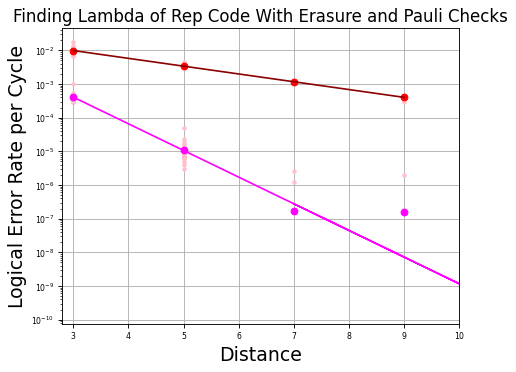

In [ ]:
e_and_p_lambda = sinter.stats_from_csv_files("lambda_rep_two_det.csv")
no_e_lambda = sinter.stats_from_csv_files("lambda_no_erase_rep_3579.csv")


def lb(d, l,a):
    y = a*l**(((d+1)/2)) 
    return y


fig, ax = plt.subplots(1, 1)


### NO E####


xs_no_e = [(stat.json_metadata['d']) for stat in no_e_lambda]
ys_no_e = [(stat.errors/stat.shots/stat.json_metadata['r']) for stat in no_e_lambda]




group_func=lambda stats: stats.json_metadata['d']
grouped_stats = sinter.group_by(no_e_lambda, key = group_func)

mean_y_list = []
group_y_list = []
for d in grouped_stats:
    grouped_ys = [(stat.errors/stat.shots/stat.json_metadata['r']) for stat in grouped_stats[d]]
    group_y_list.append(grouped_ys)
    mean_y_list.append(np.mean(grouped_ys))



plt.plot(xs_no_e,ys_no_e, ".", color = "pink")
plt.plot(grouped_stats.keys() , mean_y_list, "o", color = "red")


lb_model = Model(lb)
# lb_model.set_param_hint('a', min=0.5, max = 10)
params = lb_model.make_params()

result_no_e = lb_model.fit(mean_y_list, 
                                 d=list(grouped_stats.keys() ), 
                                 l = 0.5,
                                 a = 0.001
                                 )



print(result_no_e.fit_report())

plt.plot(grouped_stats.keys(), result_no_e.best_fit, '-', label='best fit', color = "darkred")




l = result_no_e.best_values['l']
a = result_no_e.best_values['a']

d_3_no_e = lb(3, l, a)
d_5_no_e = lb(5, l, a)
d_7_no_e = lb(7, l, a)
d_9_no_e = lb(9, l, a)


#### E AND P ######

xs_ep = [(stat.json_metadata['d']) for stat in e_and_p_lambda]
ys_ep = [(stat.errors/stat.shots/stat.json_metadata['r']) for stat in e_and_p_lambda]


group_func=lambda stats: stats.json_metadata['d']
grouped_stats = sinter.group_by(e_and_p_lambda, key = group_func)

mean_y_list = []
group_y_list = []
for d in grouped_stats:
    grouped_ys = [(stat.errors/stat.shots/stat.json_metadata['r']) for stat in grouped_stats[d]]
    group_y_list.append(grouped_ys)
    mean_y_list.append(np.mean(grouped_ys))


plt.plot(xs_ep,ys_ep, ".", color = "pink")
plt.plot(grouped_stats.keys() , mean_y_list, "o", color = "magenta")


lb_model = Model(lb)
# lb_model.set_param_hint('a', min=0.5, max = 10)
params = lb_model.make_params()

result_ep = lb_model.fit(mean_y_list, 
                                 d=list(grouped_stats.keys() ), 
                                 l = 0.5,
                                 a = 0.001
                                 )


print(result_ep.fit_report())


#plt.plot(grouped_stats.keys(), result.init_fit, '--', label='initial fit')
plt.plot(grouped_stats.keys(), result_ep.best_fit, '-', label='best fit', color = "magenta")


l = result_ep.best_values['l']
a = result_ep.best_values['a']

d_3 = lb(3, l, a)
d_5 = lb(5, l, a)
d_7 = lb(7, l, a)
d_9 = lb(9, l, a)







print(f"Lambda of non-erasure surface code is {np.mean([d_3_no_e/d_5_no_e, d_5_no_e/d_7_no_e, d_7_no_e/d_9_no_e])}")
print(f"Lambda of erasure surface code is {np.mean([d_3/d_5, d_5/d_7, d_7/d_9])}")

ax.set_yscale('log')
plt.rc('axes', titlesize = 15)
plt.rc('axes', labelsize = 15)
plt.xlabel("Distance")
plt.ylabel("Logical Error Rate per Cycle")
ax.grid(which='major')
# ax.grid(which='minor')
plt.title("Finding Lambda of Rep Code With Erasure and Pauli Checks")
plt.xlim((2.8,10))
fig.set_dpi(80) 





[[Model]]
    Model(lb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 49
    # data points      = 4
    # variables        = 2
    chi-square         = 2.1712e-11
    reduced chi-square = 1.0856e-11
    Akaike info crit   = -99.7577292
    Bayesian info crit = -100.985141
    R-squared          = 0.99999961
[[Variables]]
    l:  0.34421273 +/- 2.7997e-04 (0.08%) (init = 0.5)
    a:  0.08307962 +/- 1.4652e-04 (0.18%) (init = 0.001)
[[Correlations]] (unreported correlations are < 0.100)
    C(l, a) = -0.9840
[[Model]]
    Model(lb)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 92
    # data points      = 4
    # variables        = 2
    chi-square         = 3.4131e-12
    reduced chi-square = 1.7065e-12
    Akaike info crit   = -107.158809
    Bayesian info crit = -108.386220
    R-squared          = 0.99999819
[[Variables]]
    l:  0.07466660 +/- 7.9639e-04 (1.07%) (init = 0.5)
    a:  0.29176212 +/- 0.00624569 (2.14%) (init 

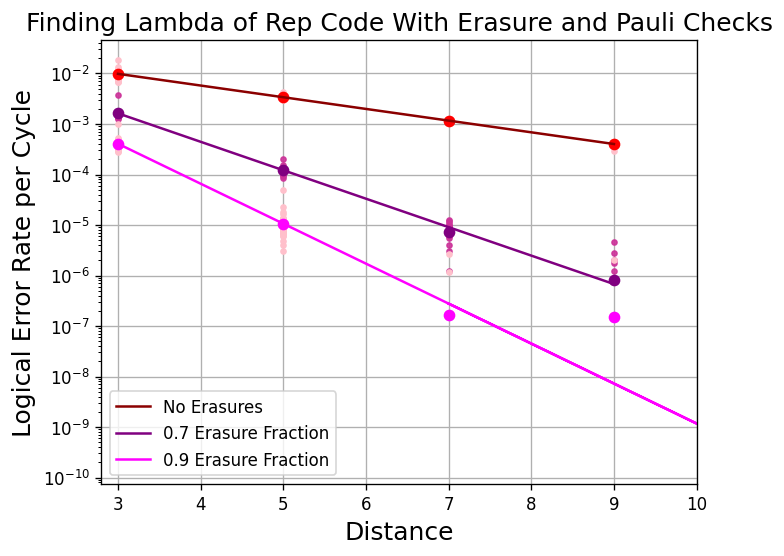

In [20]:
e_and_p_lambda = sinter.stats_from_csv_files("lambda_rep_two_det.csv")
lambda_seventy = sinter.stats_from_csv_files("lambda_7/10_rep_one_det.csv")
lambda_seventy_2 = sinter.stats_from_csv_files("lambda_7/10_rep_two_det.csv")
no_e_lambda = sinter.stats_from_csv_files("lambda_no_erase_rep_3579.csv")


def lb(d, l,a):
    y = a*l**(((d+1)/2)) 
    return y


fig, ax = plt.subplots(1, 1)


### NO E####


xs_no_e = [(stat.json_metadata['d']) for stat in no_e_lambda]
ys_no_e = [(stat.errors/stat.shots/stat.json_metadata['r']) for stat in no_e_lambda]




group_func=lambda stats: stats.json_metadata['d']
grouped_stats = sinter.group_by(no_e_lambda, key = group_func)

mean_y_list = []
group_y_list = []
for d in grouped_stats:
    grouped_ys = [(stat.errors/stat.shots/stat.json_metadata['r']) for stat in grouped_stats[d]]
    group_y_list.append(grouped_ys)
    mean_y_list.append(np.mean(grouped_ys))



plt.plot(xs_no_e,ys_no_e, ".", color = "pink")
plt.plot(grouped_stats.keys() , mean_y_list, "o", color = "red")


lb_model = Model(lb)
# lb_model.set_param_hint('a', min=0.5, max = 10)
params = lb_model.make_params()

result_no_e = lb_model.fit(mean_y_list, 
                                 d=list(grouped_stats.keys() ), 
                                 l = 0.5,
                                 a = 0.001
                                 )



print(result_no_e.fit_report())

plt.plot(grouped_stats.keys(), result_no_e.best_fit, '-', label='No Erasures', color = "darkred")




l = result_no_e.best_values['l']
a = result_no_e.best_values['a']

d_3_no_e = lb(3, l, a)
d_5_no_e = lb(5, l, a)
d_7_no_e = lb(7, l, a)
d_9_no_e = lb(9, l, a)





#### E SEVENTY (one det) ######

xs_e70 = [(stat.json_metadata['d']) for stat in lambda_seventy]
ys_e70 = [(stat.errors/stat.shots/stat.json_metadata['r']) for stat in lambda_seventy]


group_func=lambda stats: stats.json_metadata['d']
grouped_stats = sinter.group_by(lambda_seventy, key = group_func)

mean_y_list = []
group_y_list = []
for d in grouped_stats:
    grouped_ys = [(stat.errors/stat.shots/stat.json_metadata['r']) for stat in grouped_stats[d]]
    group_y_list.append(grouped_ys)
    mean_y_list.append(np.mean(grouped_ys))


plt.plot(xs_e70,ys_e70, ".", color = (.80, .20, .60, .9))
plt.plot(grouped_stats.keys() , mean_y_list, "o", color = "purple")


lb_model = Model(lb)
# lb_model.set_param_hint('a', min=0.5, max = 10)
params = lb_model.make_params()

result_ep_70 = lb_model.fit(mean_y_list, 
                                 d=list(grouped_stats.keys() ), 
                                 l = 0.5,
                                 a = 0.001
                                 )


print(result_ep_70.fit_report())


#plt.plot(grouped_stats.keys(), result.init_fit, '--', label='initial fit')
plt.plot(grouped_stats.keys(), result_ep_70.best_fit, '-', label='0.7 Erasure Fraction', color = "purple")


l = result_ep_70.best_values['l']
a = result_ep_70.best_values['a']

d_3_70 = lb(3, l, a)
d_5_70 = lb(5, l, a)
d_7_70 = lb(7, l, a)
d_9_70 = lb(9, l, a)


#### E AND P ######

xs_ep = [(stat.json_metadata['d']) for stat in e_and_p_lambda]
ys_ep = [(stat.errors/stat.shots/stat.json_metadata['r']) for stat in e_and_p_lambda]


group_func=lambda stats: stats.json_metadata['d']
grouped_stats = sinter.group_by(e_and_p_lambda, key = group_func)

mean_y_list = []
group_y_list = []
for d in grouped_stats:
    grouped_ys = [(stat.errors/stat.shots/stat.json_metadata['r']) for stat in grouped_stats[d]]
    group_y_list.append(grouped_ys)
    mean_y_list.append(np.mean(grouped_ys))


plt.plot(xs_ep,ys_ep, ".", color = "pink")
plt.plot(grouped_stats.keys() , mean_y_list, "o", color = "magenta")


lb_model = Model(lb)
# lb_model.set_param_hint('a', min=0.5, max = 10)
params = lb_model.make_params()

result_ep = lb_model.fit(mean_y_list, 
                                 d=list(grouped_stats.keys() ), 
                                 l = 0.5,
                                 a = 0.001
                                 )


print(result_ep.fit_report())


#plt.plot(grouped_stats.keys(), result.init_fit, '--', label='initial fit')
plt.plot(grouped_stats.keys(), result_ep.best_fit, '-', label='0.9 Erasure Fraction', color = "magenta")


l = result_ep.best_values['l']
a = result_ep.best_values['a']

d_3 = lb(3, l, a)
d_5 = lb(5, l, a)
d_7 = lb(7, l, a)
d_9 = lb(9, l, a)















print(f"Lambda of non-erasure surface code is {np.mean([d_3_no_e/d_5_no_e, d_5_no_e/d_7_no_e, d_7_no_e/d_9_no_e])}")
print(f"Lambda of 90% erasure surface code is {np.mean([d_3/d_5, d_5/d_7, d_7/d_9])}")
print(f"Lambda of 70% erasure surface code is {np.mean([d_3_70/d_5_70, d_5_70/d_7_70, d_7_70/d_9_70])}")

ax.set_yscale('log')
plt.rc('axes', titlesize = 15)
plt.rc('axes', labelsize = 15)
plt.xlabel("Distance")
plt.ylabel("Logical Error Rate per Cycle")
ax.grid(which='major')
# ax.grid(which='minor')
plt.title("Finding Lambda of Rep Code With Erasure and Pauli Checks")
plt.xlim((2.8,10))
plt.legend()
fig.set_dpi(120) 



#  Det location threshold comparison

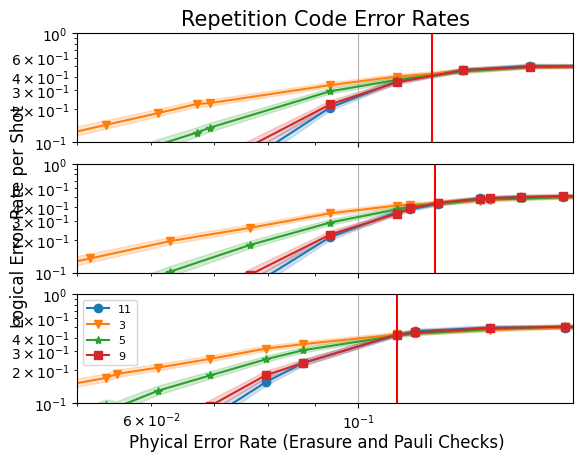

In [ ]:

fig, (ax1, ax2, ax3) = plt.subplots(3, sharex=True)
plt.rc('font', size=10) #controls default text size
plt.rc("axes", titlesize=11)
plt.rc("axes", labelsize=17)
plt.rc('xtick', labelsize=7) #fontsize of the x tick labels
plt.rc('ytick', labelsize=7) #fontsize of the y tick labels
plt.rc('legend', fontsize=8)


bitflip_factor = 1/10
x_factor = 1 + bitflip_factor


thresh_one_det_stats = sinter.stats_from_csv_files("threshold_one_det.csv")
thresh_two_det_stats = sinter.stats_from_csv_files("threshold_two_det.csv")
thresh_three_det_stats = sinter.stats_from_csv_files("threshold_three_det.csv")

# Render a matplotlib plot of the data.



# fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax1,
    stats=thresh_one_det_stats,
    x_func=lambda stat: (x_factor)*(stat.json_metadata['p']),
    group_func=lambda stat: stat.json_metadata['d'],
    #failure_units_per_shot_func=lambda stat: stat.json_metadata['r'],
)

sinter.plot_error_rate(
    ax=ax2,
    stats=thresh_two_det_stats,
    x_func=lambda stat: (x_factor)*(stat.json_metadata['p']),
    group_func=lambda stat: stat.json_metadata['d'],
    #failure_units_per_shot_func=lambda stat: stat.json_metadata['r'],
)

sinter.plot_error_rate(
    ax=ax3,
    stats=thresh_three_det_stats,
    x_func=lambda stat: (x_factor)*(stat.json_metadata['p']),
    group_func=lambda stat: stat.json_metadata['d'],
    #failure_units_per_shot_func=lambda stat: stat.json_metadata['r'],
)


plt.xlim(5e-2, 1.7e-1)
fig.supylabel("Logical Error Rate per Shot")
fig.supxlabel("Phyical Error Rate (Erasure and Pauli Checks)")

ax1.loglog()
ax1.set_title("Repetition Code Error Rates")

ax1.grid(which='major')
ax1.set_ylim((1e-1,1))
# ax1.legend()
ax1.vlines(1.2e-1, 1e-2, 1, "red")

ax2.loglog()

ax2.grid(which='major')
ax2.set_ylim((1e-1,1))
#ax2.legend()
ax2.vlines(1.21e-1, 1e-2, 1, "red")

ax3.loglog()
ax3.grid(which='major')
ax3.set_ylim((1e-1,1))
ax3.vlines(1.1e-1, 1e-7, 1, "red")
ax3.legend()

plt.set_dpi(120)


# 7/10 thresh comparison

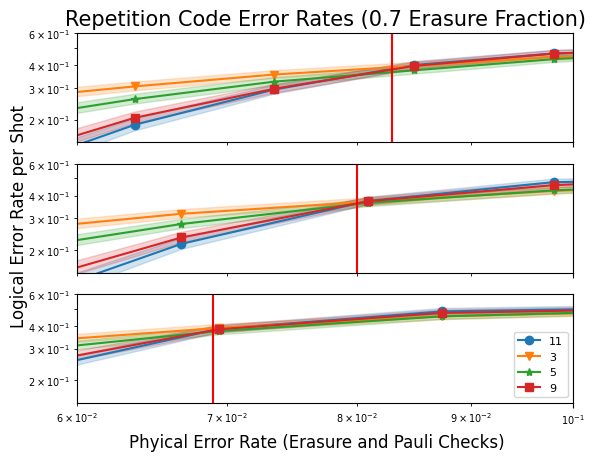

In [31]:

fig, (ax1, ax2, ax3) = plt.subplots(3, sharex=True)
plt.rc('font', size=10) #controls default text size
plt.rc("axes", titlesize=15)
plt.rc("axes", labelsize=17)
plt.rc('xtick', labelsize=7) #fontsize of the x tick labels
plt.rc('ytick', labelsize=7) #fontsize of the y tick labels
plt.rc('legend', fontsize=8)


bitflip_factor = 1/10
x_factor = 1 + bitflip_factor


thresh_one_det_stats = sinter.stats_from_csv_files("thresh_seventy_percent_one_det.csv")
thresh_two_det_stats = sinter.stats_from_csv_files("thresh_seventy_percent_two_det.csv")
thresh_three_det_stats = sinter.stats_from_csv_files("thresh_seventy_percent_three_det.csv")

# Render a matplotlib plot of the data.



# fig, ax = plt.subplots(1, 1)
sinter.plot_error_rate(
    ax=ax1,
    stats=thresh_one_det_stats,
    x_func=lambda stat: (x_factor)*(stat.json_metadata['p']),
    group_func=lambda stat: stat.json_metadata['d'],
    #failure_units_per_shot_func=lambda stat: stat.json_metadata['r'],
)

sinter.plot_error_rate(
    ax=ax2,
    stats=thresh_two_det_stats,
    x_func=lambda stat: (x_factor)*(stat.json_metadata['p']),
    group_func=lambda stat: stat.json_metadata['d'],
    #failure_units_per_shot_func=lambda stat: stat.json_metadata['r'],
)

sinter.plot_error_rate(
    ax=ax3,
    stats=thresh_three_det_stats,
    x_func=lambda stat: (x_factor)*(stat.json_metadata['p']),
    group_func=lambda stat: stat.json_metadata['d'],
    #failure_units_per_shot_func=lambda stat: stat.json_metadata['r'],
)


plt.xlim(6e-2, 1e-1)
fig.supylabel("Logical Error Rate per Shot")
fig.supxlabel("Phyical Error Rate (Erasure and Pauli Checks)")

ax1.loglog()
ax1.set_title("Repetition Code Error Rates (0.7 Erasure Fraction)")

ax1.grid(which='major')
ax1.set_ylim((1.5e-1,6e-1))
# ax1.legend()
ax1.vlines(8.3e-2, 1e-2, 1, "red")

ax2.loglog()

ax2.grid(which='major')
ax2.set_ylim((1.5e-1,6e-1))
#ax2.legend()
ax2.vlines(8e-2, 1e-2, 1, "red")

ax3.loglog()
ax3.grid(which='major')
ax3.set_ylim((1.5e-1,6e-1))
ax3.vlines(6.9e-2, 1e-7, 1, "red")
ax3.legend()
